### Цель работы – получить навыки оценки важности признаков с помощью значений Шепли, визуализации активации карт признаков нейросети, признаков, извлекаемых моделью, признаков входных данных, влияющих на результат работы нейросети.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install shap tf-explain pdpbox
import shap
import tensorflow as tf
from tensorflow.keras.models import Model, load_model
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image
from tf_explain.core.grad_cam import GradCAM
from tensorflow.keras import backend as K
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.resnet50 import preprocess_input
import pandas as pd
from pdpbox import pdp, info_plots

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.8/35.8 MB 15.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 36.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.7/61.7 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.1/121.1 kB 12.7 MB/s eta 0:00:00


## Свёрточная модель

In [ ]:
# Загрузка обученной модели
model = load_model('/content/drive/MyDrive/МАГИСТРАТУРА/MASTERS/Глубокое обучение/best_model_fc_layers-lab3.h5')

In [ ]:
classes = ['Pepper__bell___Bacterial_spot', 'Potato___healthy', 'Pepper__bell___healthy']

# Загрузка и предобработка изображений
image_paths = ['/content/drive/MyDrive/МАГИСТРАТУРА/MASTERS/Глубокое обучение/pepper_bell_bacterial_spot.jpeg',
               '/content/drive/MyDrive/МАГИСТРАТУРА/MASTERS/Глубокое обучение/pepper_bell_healthy.jpeg',
               '/content/drive/MyDrive/МАГИСТРАТУРА/MASTERS/Глубокое обучение/potato_healthy.jpeg']

# Загрузка и предобработка изображений
def load_and_preprocess_image(path):
    img = load_img(path, target_size=(224, 224))
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = preprocess_input(img)
    return img

# Загрузка и подготовка всех изображений
images = np.vstack([load_and_preprocess_image(path) for path in image_paths])

print(images.shape)  # Проверка размерности массива изображений


(3, 224, 224, 3)


In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 flatten_1 (Flatten)         (None, 100352)            0         
                                                                 
 dense_2 (Dense)             (None, 256)               25690368  
                                                                 
 dense_3 (Dense)             (None, 3)                 771       
                                                                 
Total params: 49278851 (187.98 MB)
Trainable params: 25691139 (98.00 MB)
Non-trainable params: 23587712 (89.98 MB)
_________________________________________________________________


In [ ]:
# Вывод информации о слоях внутри 'resnet50'
for i, layer in enumerate(model.get_layer('resnet50').layers):
    print(i, layer.name)

0 input_2
1 conv1_pad
2 conv1_conv
3 conv1_bn
4 conv1_relu
5 pool1_pad
6 pool1_pool
7 conv2_block1_1_conv
8 conv2_block1_1_bn
9 conv2_block1_1_relu
10 conv2_block1_2_conv
11 conv2_block1_2_bn
12 conv2_block1_2_relu
13 conv2_block1_0_conv
14 conv2_block1_3_conv
15 conv2_block1_0_bn
16 conv2_block1_3_bn
17 conv2_block1_add
18 conv2_block1_out
19 conv2_block2_1_conv
20 conv2_block2_1_bn
21 conv2_block2_1_relu
22 conv2_block2_2_conv
23 conv2_block2_2_bn
24 conv2_block2_2_relu
25 conv2_block2_3_conv
26 conv2_block2_3_bn
27 conv2_block2_add
28 conv2_block2_out
29 conv2_block3_1_conv
30 conv2_block3_1_bn
31 conv2_block3_1_relu
32 conv2_block3_2_conv
33 conv2_block3_2_bn
34 conv2_block3_2_relu
35 conv2_block3_3_conv
36 conv2_block3_3_bn
37 conv2_block3_add
38 conv2_block3_out
39 conv3_block1_1_conv
40 conv3_block1_1_bn
41 conv3_block1_1_relu
42 conv3_block1_2_conv
43 conv3_block1_2_bn
44 conv3_block1_2_relu
45 conv3_block1_0_conv
46 conv3_block1_3_conv
47 conv3_block1_0_bn
48 conv3_block1_3_bn

### Визуализация активаций

In [ ]:
# Выбираем слои для визуализации активаций
selected_layers = ['conv1_conv', 'conv3_block4_out', 'conv5_block3_out']

# Создаём модель для визуализации активаций
activation_model = Model(inputs=model.get_layer('resnet50').input,
                         outputs=[model.get_layer('resnet50').get_layer(name).output for name in selected_layers])

In [ ]:
def plot_activations(original_img, activations, layer_names):
    original_img = np.squeeze(original_img)  # Убираем размерность пакета для визуализации
    original_img = (original_img - np.min(original_img)) / (np.max(original_img) - np.min(original_img))  # Нормализация

    n_layers = len(activations)  # Количество слоев для визуализации
    plt.figure(figsize=(20, 3))  # Установим размер всей сетки графиков

    # Отображение оригинального изображения
    plt.subplot(1, n_layers + 1, 1)
    plt.imshow(original_img, aspect='auto')
    plt.title('Оригинал')

    for i, (layer_activation, layer_name) in enumerate(zip(activations, layer_names), start=2):
        n_features = layer_activation.shape[-1]  # Количество фильтров в слое
        size = layer_activation.shape[1]  # Размер фича-мапы

        # Создаем сетку для отображения
        n_cols = n_features // 16  # Сколько столбцов фича-мап в сетке
        display_grid = np.zeros((size * n_cols, size * 16))

        for col in range(n_cols):
            for row in range(16):
                if col * 16 + row < n_features:
                    channel_image = layer_activation[0, :, :, col * 16 + row]
                    channel_image -= channel_image.mean()
                    channel_image /= channel_image.std()
                    channel_image *= 64
                    channel_image += 128
                    channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                    display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

        # Отображаем активации для слоя
        plt.subplot(1, n_layers + 1, i)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')
        plt.title(layer_name)
        plt.grid(False)

    plt.show()


1/1 [==============================] - 1s 1s/step


invalid value encountered in divide


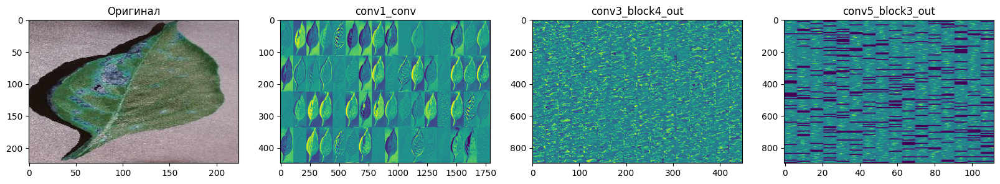

1/1 [==============================] - 0s 290ms/step


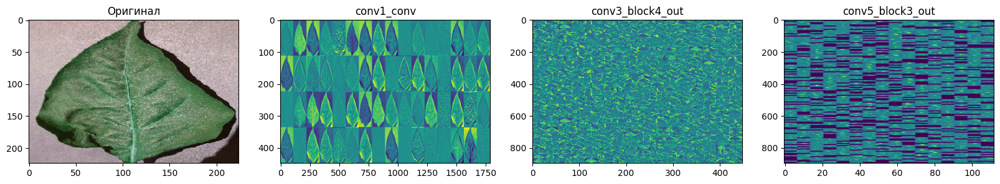

1/1 [==============================] - 0s 245ms/step


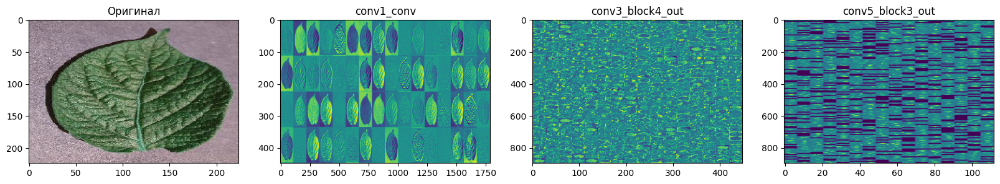

In [ ]:
for img in images:
    img_with_batch = np.expand_dims(img, axis=0)
    activations = activation_model.predict(img_with_batch)
    plot_activations(img_with_batch, activations, selected_layers)

### Визуализация фильтров

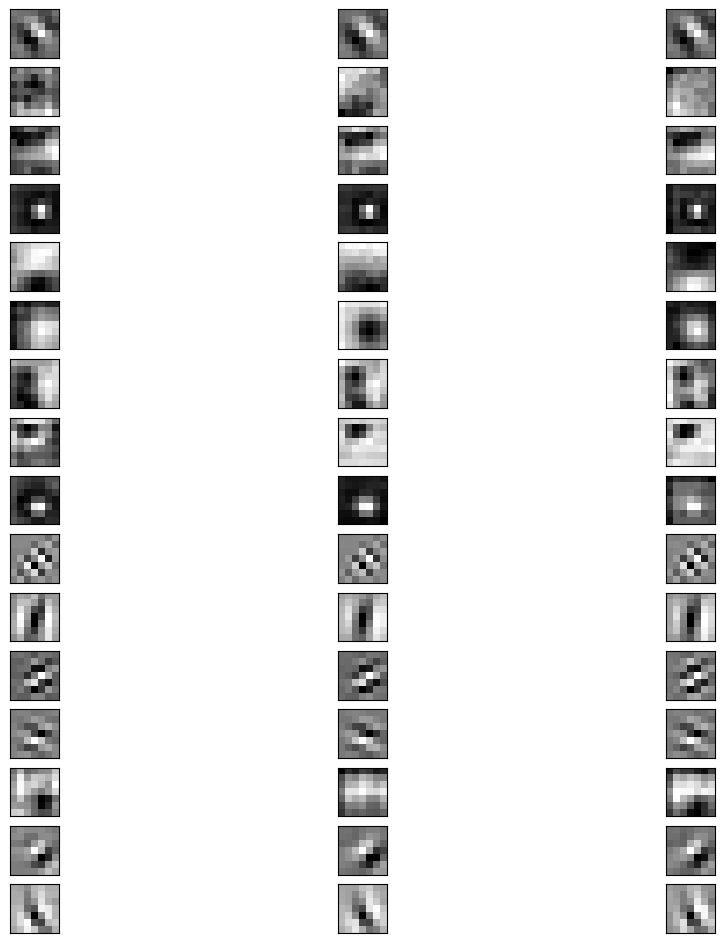

In [ ]:
def plot_filters(layer, n_filters=16):
    # Получаем веса из слоя (фильтры)
    filters, biases = layer.get_weights()

    # Нормализация фильтров для визуализации
    f_min, f_max = filters.min(), filters.max()
    filters = (filters - f_min) / (f_max - f_min)

    # Выбираем первые n_filters для отображения
    filter_count = filters.shape[3]
    n_filters = min(n_filters, filter_count)

    # Создаем сетку для отображения
    plt.figure(figsize=(12, 12))

    for i in range(n_filters):
        # Получаем фильтр
        f = filters[:, :, :, i]

        # Отображаем каждый канал отдельно
        for j in range(3):  # 3 канала (R, G, B)
            ax = plt.subplot(n_filters, 3, i * 3 + j + 1)
            ax.set_xticks([])
            ax.set_yticks([])
            plt.imshow(f[:, :, j], cmap='gray')

    plt.show()

# Выбираем первый сверточный слой
first_conv_layer = model.get_layer('resnet50').get_layer('conv1_conv')

# Визуализация фильтров этого слоя
plot_filters(first_conv_layer, n_filters=16) # количество фильтров выбираем произвольно (в данном случае 16 взято для простоты визуализации)


### GradCAM

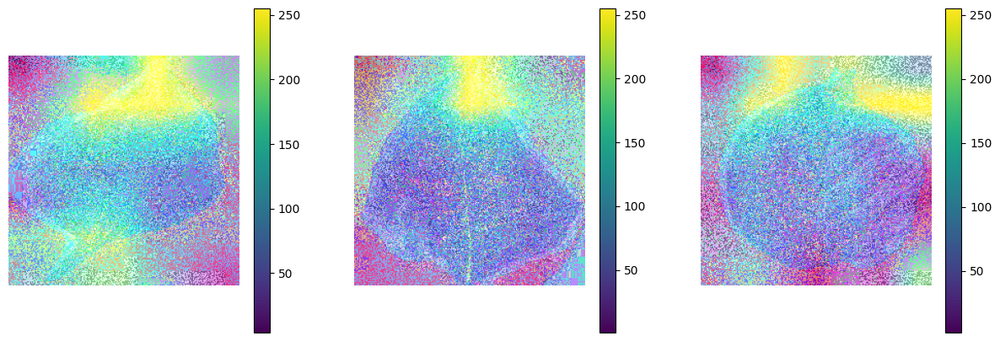

In [ ]:
# Создание новой модели с выходом из последнего сверточного слоя 'resnet50'
resnet_model = model.get_layer('resnet50')
last_conv_layer = resnet_model.get_layer('conv5_block3_out')
new_model = Model(inputs=resnet_model.inputs, outputs=last_conv_layer.output)

# Создаем экземпляр GradCAM
explainer = GradCAM()

plt.figure(figsize=(15, 5))

for i, img in enumerate(images):
    # Подготавливаем изображение
    img_array = np.expand_dims(img, axis=0)  # Добавляем размерность пакета

    # Создаем данные для GradCAM
    data = (img_array, None)

    # Вызываем GradCAM
    grid = explainer.explain(data, new_model, class_index=0, layer_name='conv5_block3_out')

    # Визуализация
    plt.subplot(1, len(images), i + 1)
    plt.imshow(grid, cmap='viridis')  # Используем цветовую шкалу 'viridis'
    plt.colorbar()  # Добавляем цветовую шкалу под графиком
    plt.axis('off')

plt.show()


### SHAP

In [ ]:
# Инициализация SHAP GradientExplainer с полной моделью
explainer = shap.GradientExplainer(model, images)

# Вычисление значений Шепли для массива изображений
shap_values = explainer.shap_values(images)


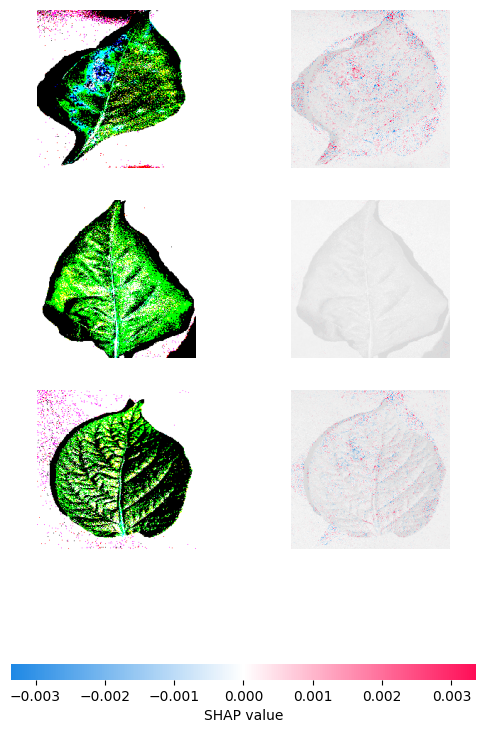

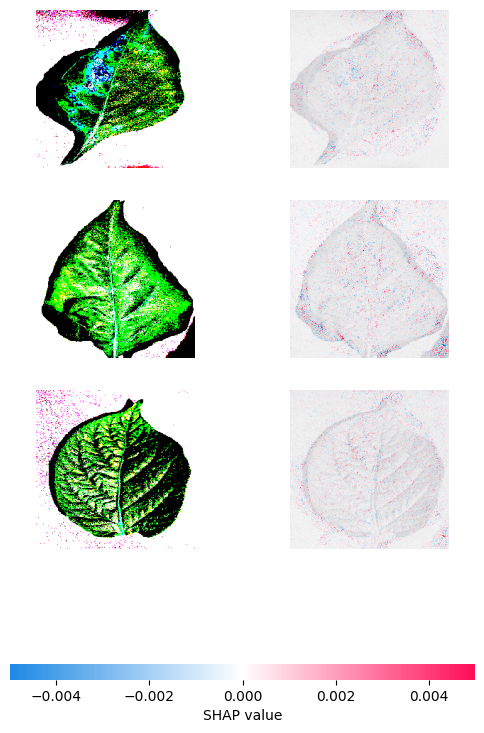

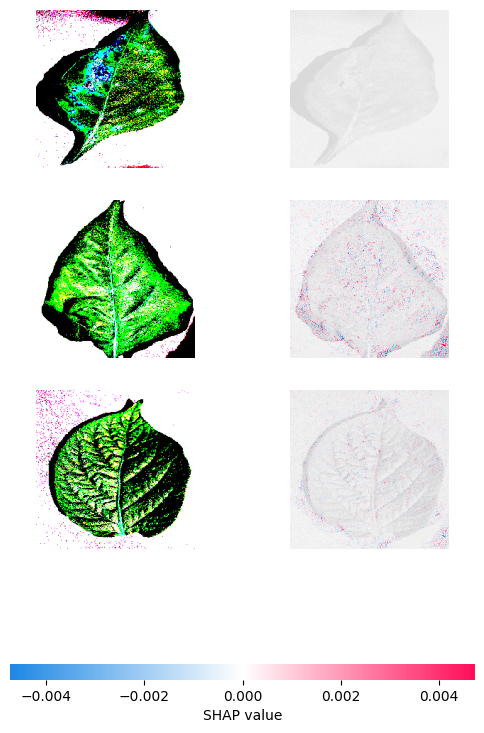

In [ ]:
# Визуализация значений Шепли для всех трёх классов
for i in range(3):
    shap.image_plot(shap_values[i], images)


## Классификатор

### Расчет значений Шепли

In [ ]:
# Загрузка модели
model = tf.keras.models.load_model('/content/best_multiclass_model-lab1.h5')

# Загрузка датасета
data = pd.read_csv('/content/combined_test_dataset-lab1_multiclass.csv')
X_test = data.drop('label', axis=1)
y_test = data['label']

# Создаем объект KernelExplainer
explainer = shap.KernelExplainer(model.predict, shap.sample(X_test, 5))  # Используем подвыборку для ускорения расчета

# Расчет значений Шепли
shap_values = explainer.shap_values(X_test, nsamples=100)  # Ограничиваем количество образцов для ускорения процесса

# Вывод результатов
print(shap_values)


1/1 [==============================] - 0s 78ms/step


  0%|          | 0/2610 [00:00<?, ?it/s]

Выходные данные были обрезаны до нескольких последних строк (5000).
16/16 [==============================] - 0s 2ms/step
[array([[-0.05214548,  0.1632078 ,  0.01769959, ...,  0.17562306,
         0.08543565,  0.06833079],
       [-0.10571545,  0.        , -0.00825511, ..., -0.16759959,
         0.05739591,  0.05285032],
       [-0.04960181, -0.02332048,  0.        , ..., -0.195845  ,
         0.02069695,  0.03184616],
       ...,
       [-0.08800244,  0.21898919,  0.05418236, ...,  0.24897469,
         0.04688716,  0.02281436],
       [-0.0939529 , -0.02693137, -0.01917377, ..., -0.15152668,
        -0.00426654,  0.04614542],
       [ 0.        ,  0.21233708,  0.        , ...,  0.26156318,
         0.06240423,  0.01231589]]), array([[-0.0735162 , -0.0115719 ,  0.        , ..., -0.0434404 ,
        -0.00573723, -0.05549961],
       [ 0.05507794, -0.06037326, -0.01731937, ...,  0.13402332,
         0.06027569,  0.02723887],
       [-0.06126863, -0.04743758,  0.        , ..., -0.09605048,

### Оценка важности признаков как среднее значение абсолютных значений

In [ ]:
# Вычисляем среднее абсолютное значение Шепли для каждого признака по всем классам
mean_shap_values = np.abs(shap_values).mean(axis=1)

# Создаем DataFrame для наглядности
feature_names = X_test.columns
shap_df = pd.DataFrame(mean_shap_values, columns=feature_names)

# Выводим DataFrame
print(shap_df)



          0         1         2         3         4         5         6  \
0  0.086109  0.056517  0.011846  0.051435  0.012607  0.010241  0.009734   
1  0.048898  0.090708  0.016370  0.041718  0.014815  0.013565  0.014616   
2  0.058572  0.058403  0.025976  0.033592  0.021548  0.013508  0.012829   
3  0.069225  0.149449  0.014869  0.085172  0.036946  0.008586  0.008350   

          7         8         9        10  
0  0.065859  0.139739  0.102315  0.055798  
1  0.029179  0.096947  0.066499  0.027964  
2  0.036957  0.120226  0.058679  0.028679  
3  0.054590  0.165636  0.136725  0.031337  


### Визуализировать значения Шепли для наборов данных и полученные значения важности

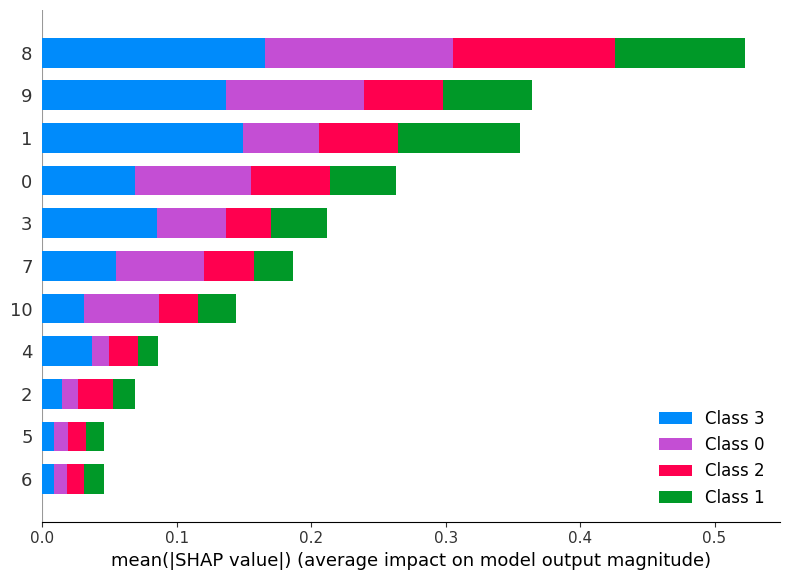

In [ ]:
# Визуализация с помощью summary_plot
shap.summary_plot(shap_values, features=X_test, feature_names=X_test.columns)


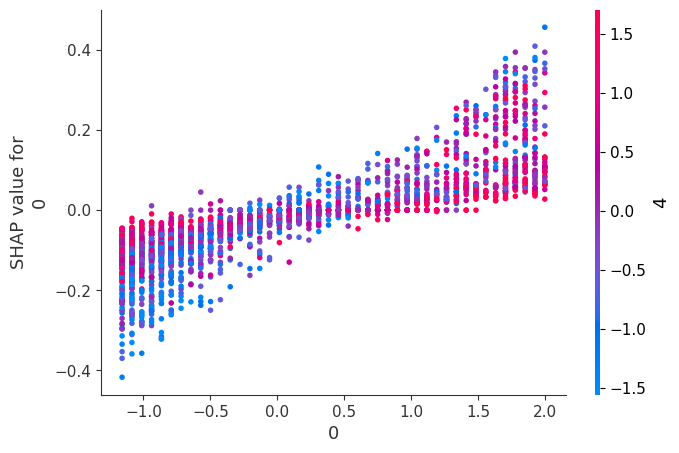

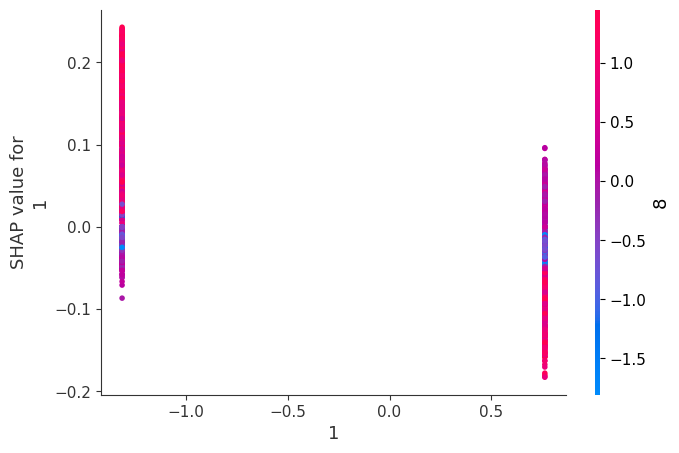

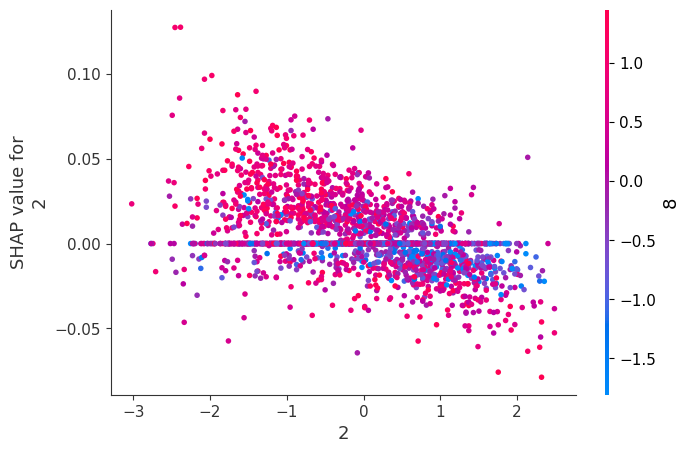

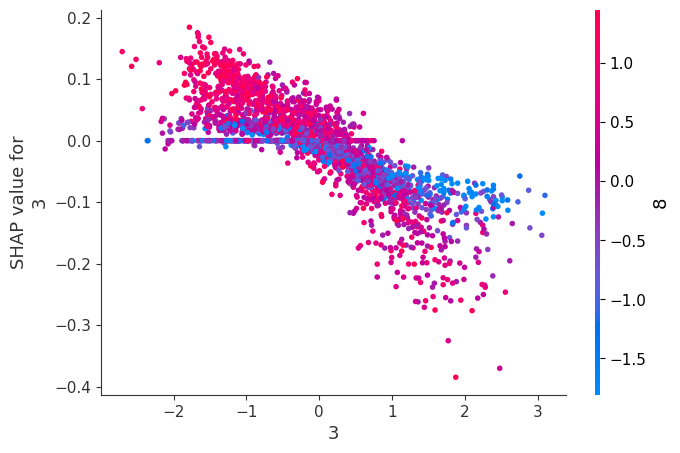

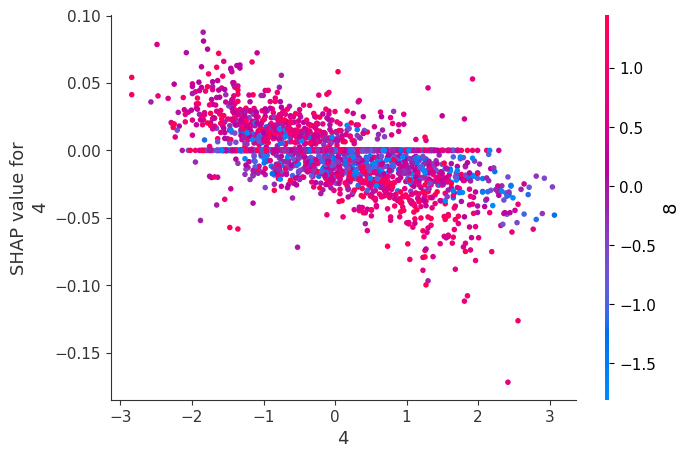

...

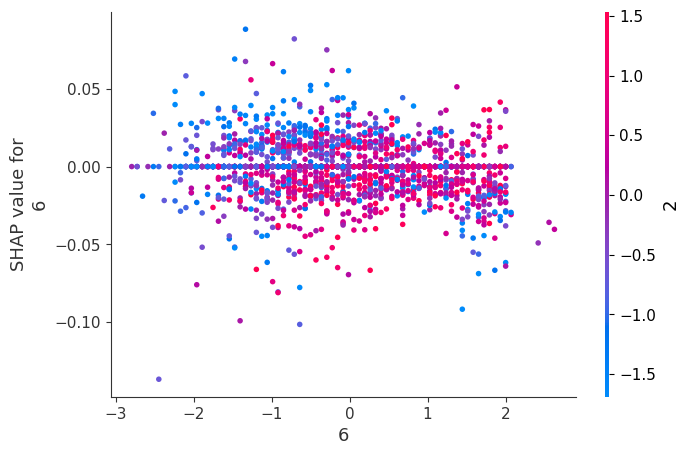

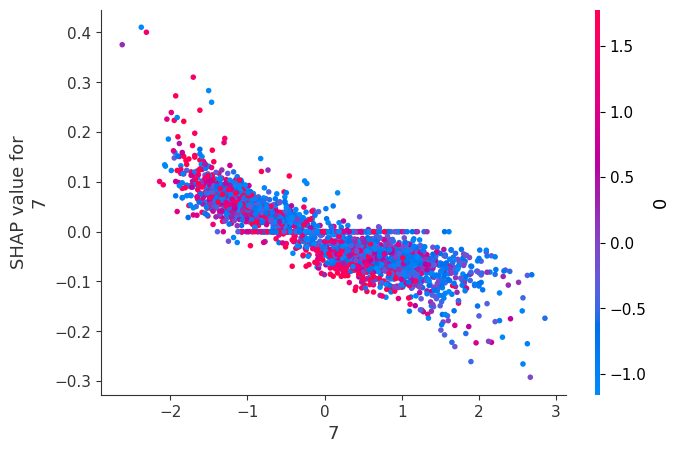

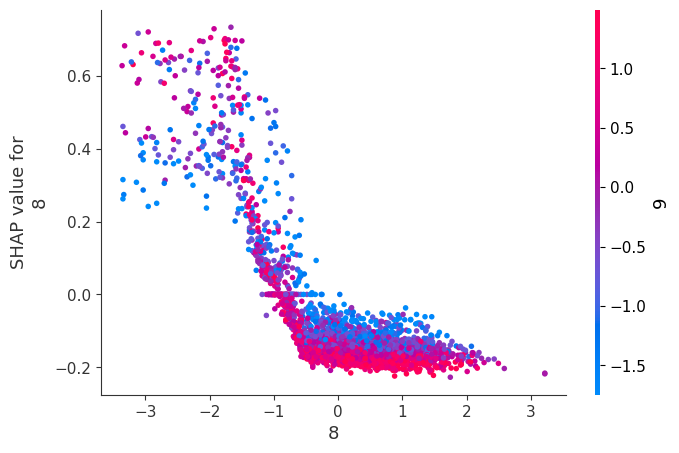

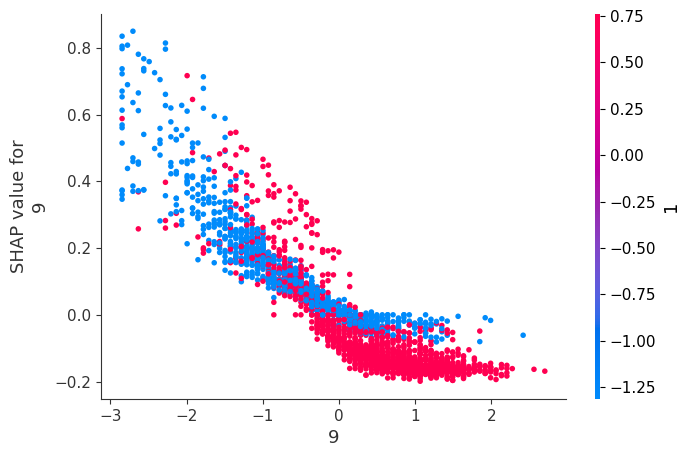

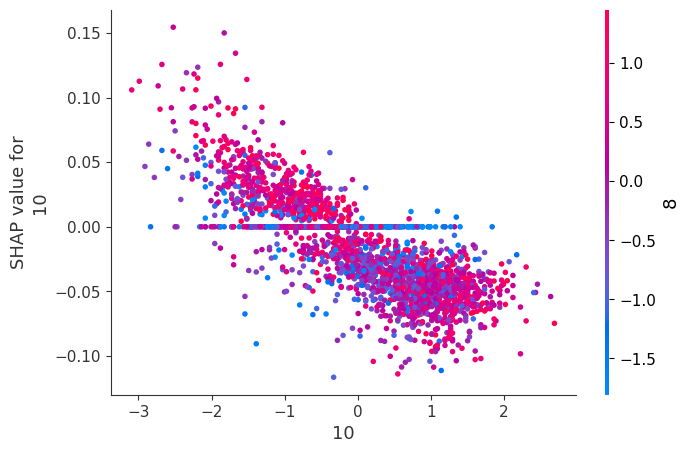

In [ ]:
# feature_names - список названий признаков
feature_names = X_test.columns

# Количество классов
num_classes = 4

# Для каждого признака и каждого класса создаем отдельный dependence_plot
for class_index in range(num_classes):
    for feature_name in feature_names:
        # Создаем новый график для каждой пары признак-класс
        shap.dependence_plot(feature_name, shap_values[class_index], features=X_test, feature_names=feature_names)


### Детальный анализ отдельных примеров

In [ ]:
# Выбираем случайные примеры для каждого класса
selected_samples = pd.DataFrame()

for class_value in np.unique(data['label']):
    class_samples = data[data['label'] == class_value].sample(2)
    selected_samples = selected_samples.append(class_samples)

selected_samples


The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


,0,1,2,3,4,5,6,7,8,9,10,label
2406,-0.939067,0.761885,0.051777,0.021331,-1.315553,-0.365338,1.862772,0.416604,0.970920,1.494228,1.323671,0
230,0.896521,-1.312533,-0.512269,-0.780915,0.537043,-1.898534,-1.474743,-0.627953,0.484970,-0.284626,-0.613263,0
1675,-0.792220,0.761885,1.587904,1.320453,0.112784,1.551157,1.932303,1.014851,-0.211120,0.640378,0.238988,1
983,1.557333,-1.312533,-1.544355,0.288746,1.937096,1.838631,0.958862,-1.150231,0.576907,-1.067322,-1.026475,1
1945,-1.085914,0.761885,0.171787,0.547536,0.112784,-1.323586,-1.961464,-0.048698,-1.117350,1.209611,0.678026,2
5,-1.085914,0.761885,0.411807,-0.039053,-0.792301,0.113785,0.472141,0.862915,0.918385,1.067303,0.238988,2
162,1.337062,0.761885,0.603823,0.906390,-0.141771,0.113785,-0.709896,0.464084,-3.061147,0.924994,-0.122573,3
2264,1.924451,-1.312533,-1.976390,-0.047679,2.361355,-0.173689,-0.640364,-1.359143,-0.710203,-2.561559,-1.904552,3


  0%|          | 0/1 [00:00<?, ?it/s]

320/320 [==============================] - 1s 2ms/step


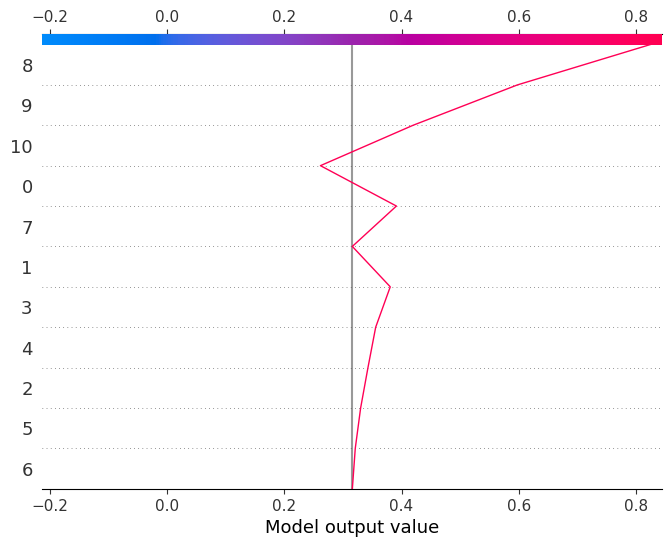

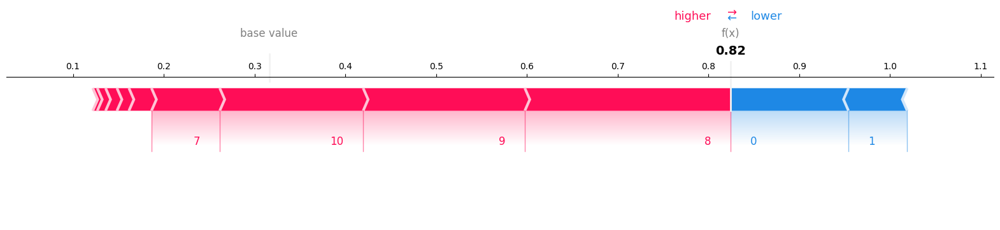

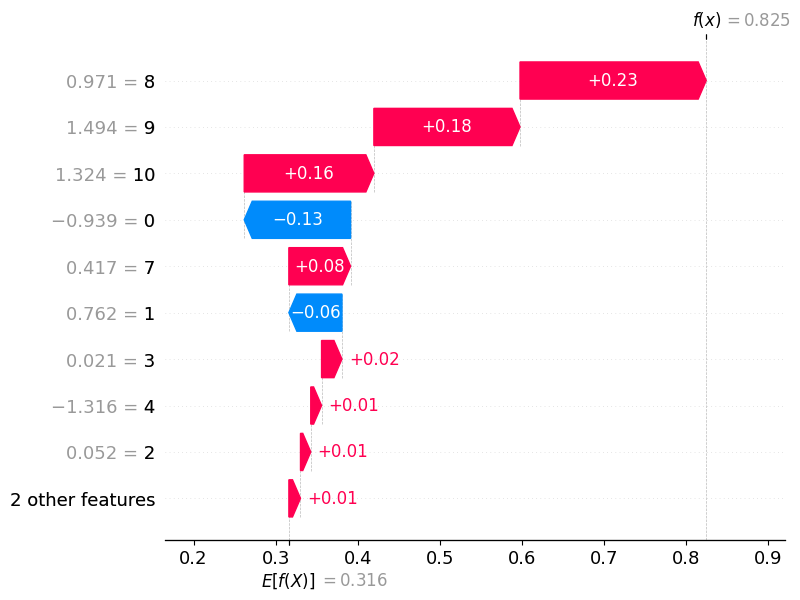

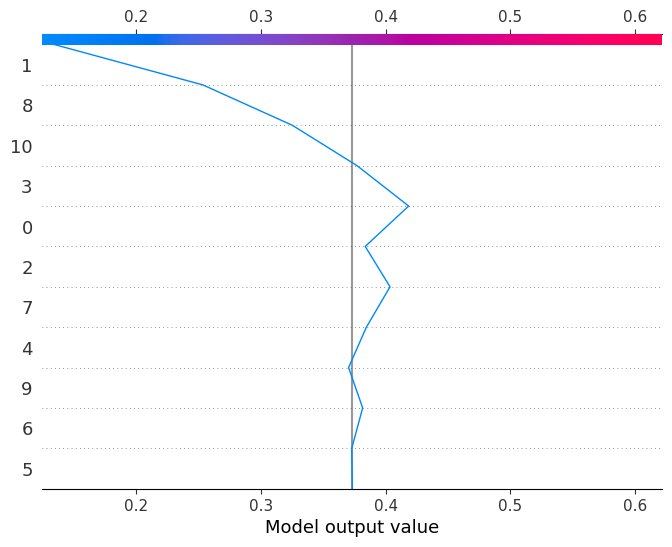

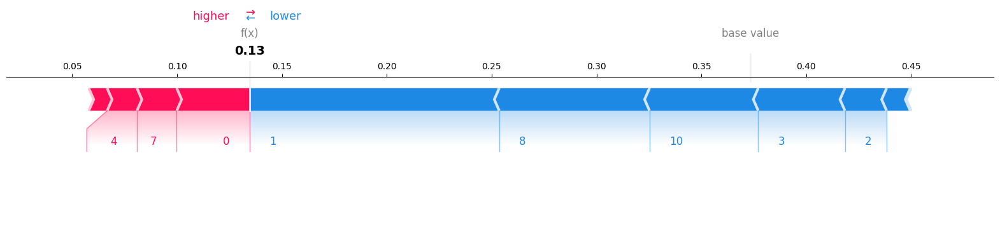

...

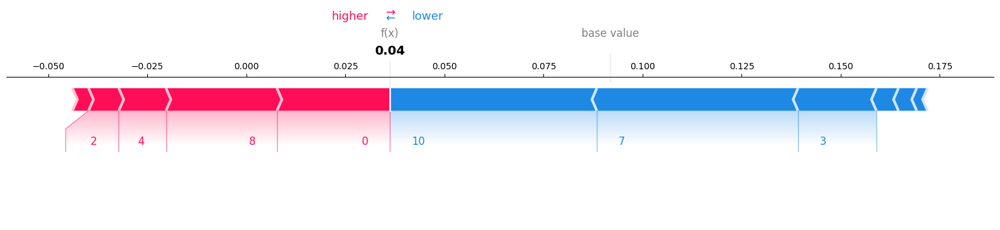

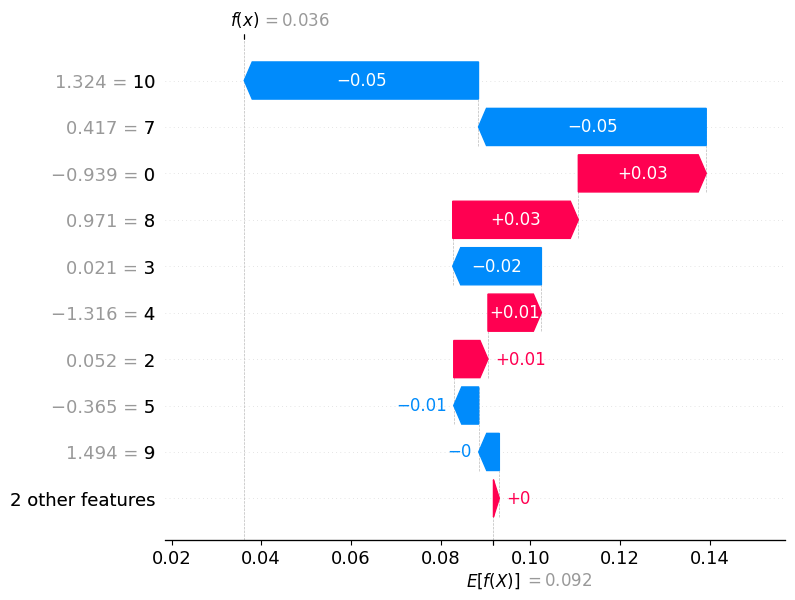

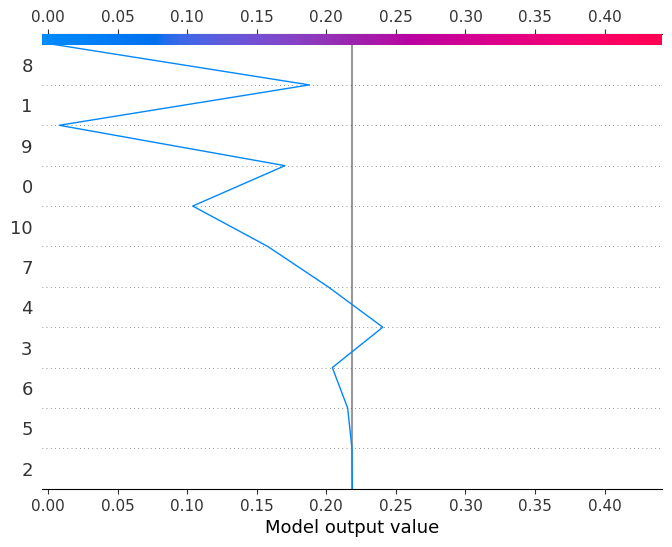

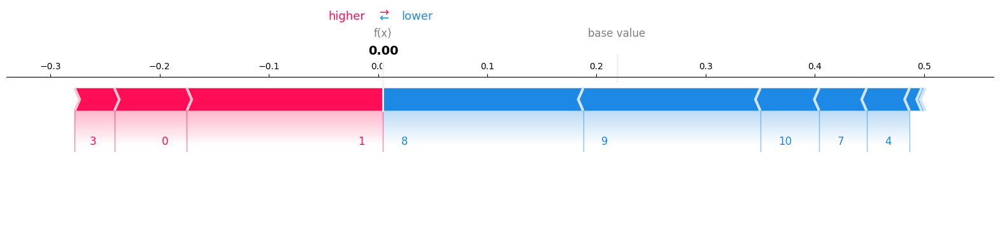

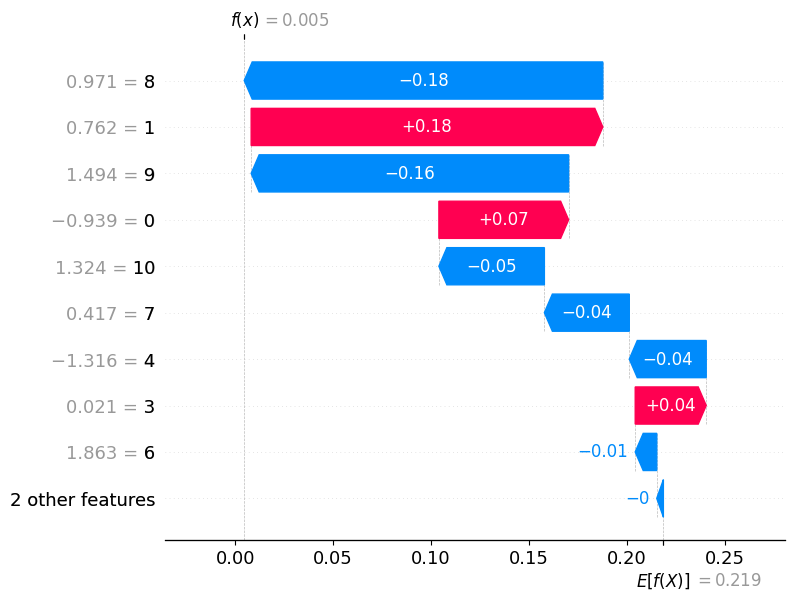

  0%|          | 0/1 [00:00<?, ?it/s]

320/320 [==============================] - 1s 2ms/step


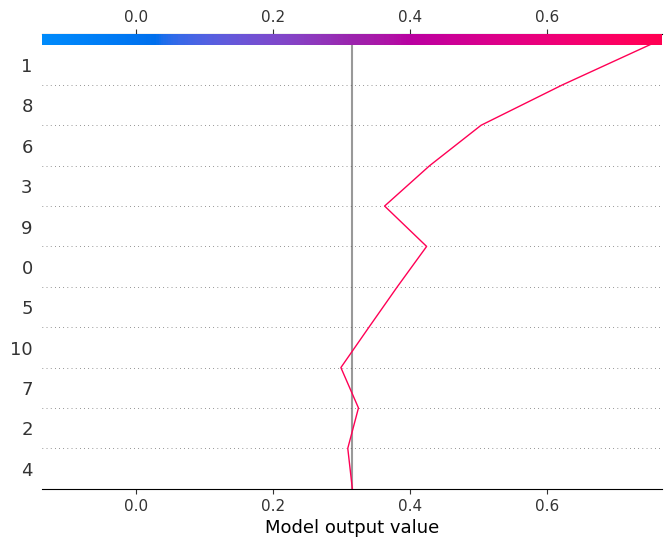

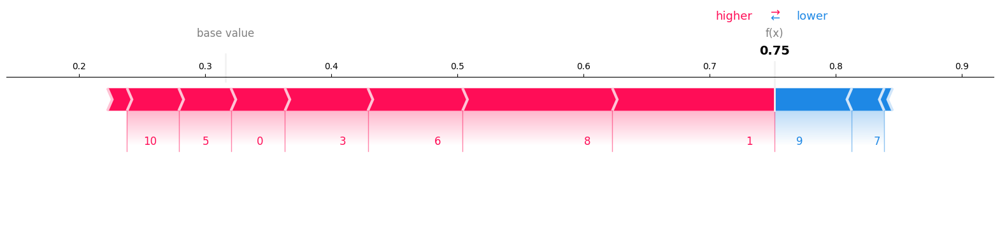

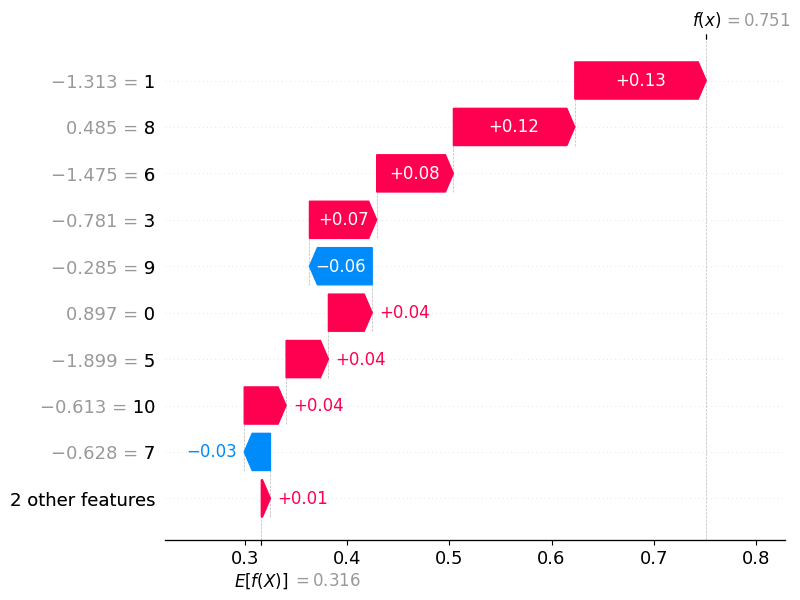

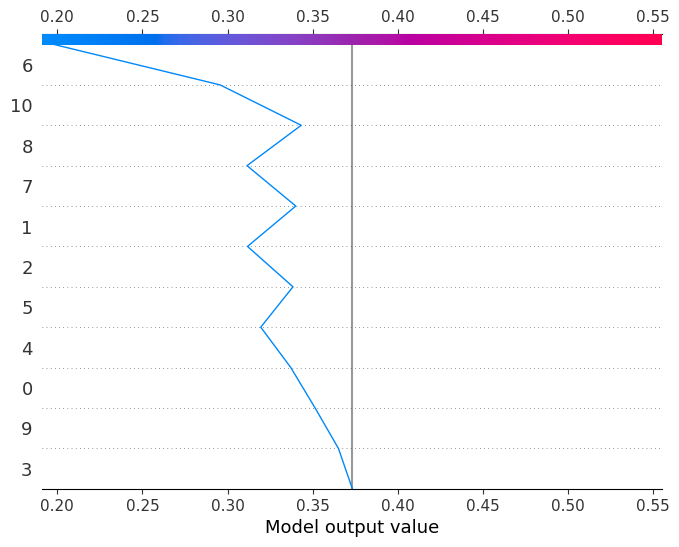

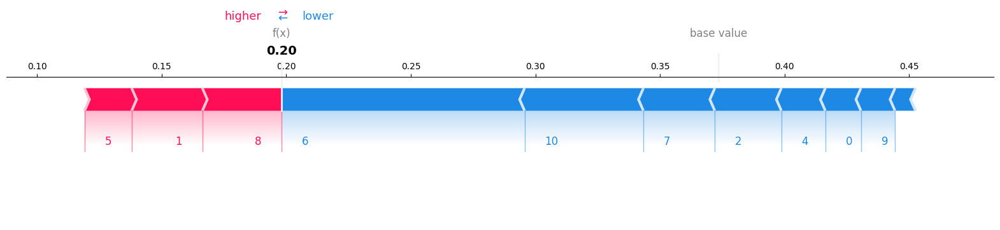

...

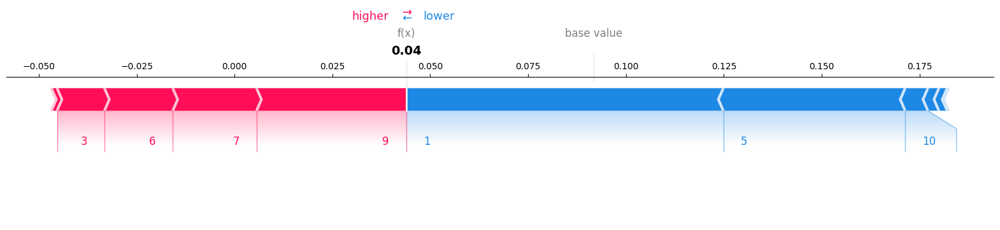

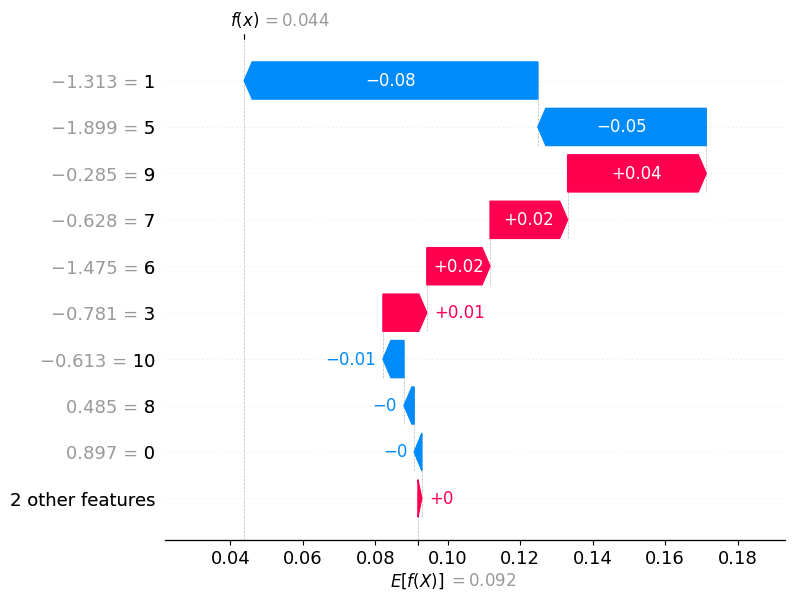

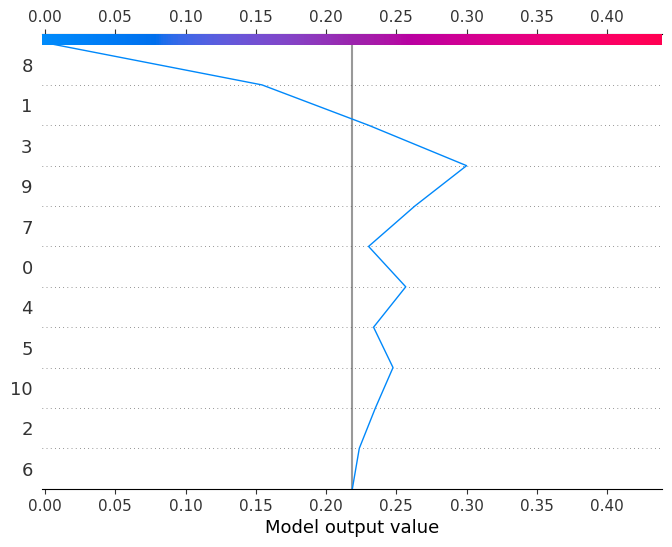

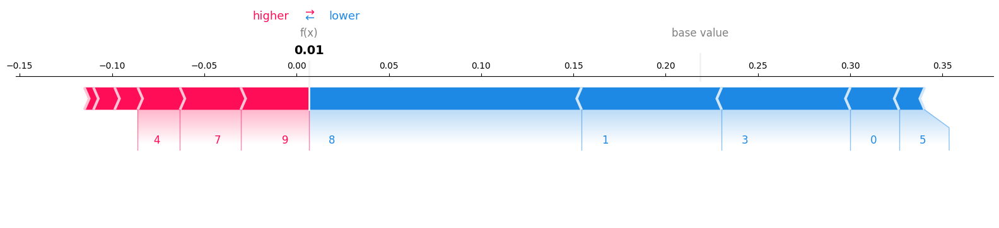

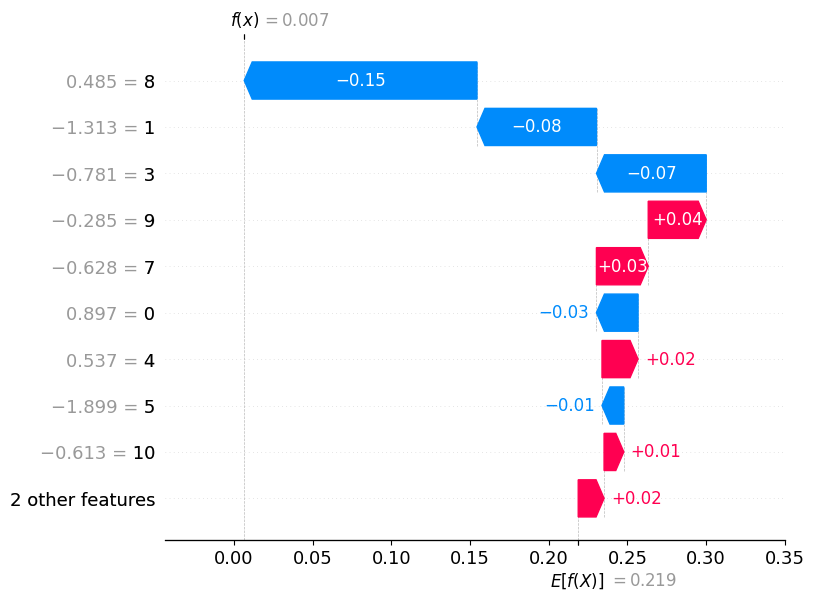

  0%|          | 0/1 [00:00<?, ?it/s]

320/320 [==============================] - 1s 3ms/step


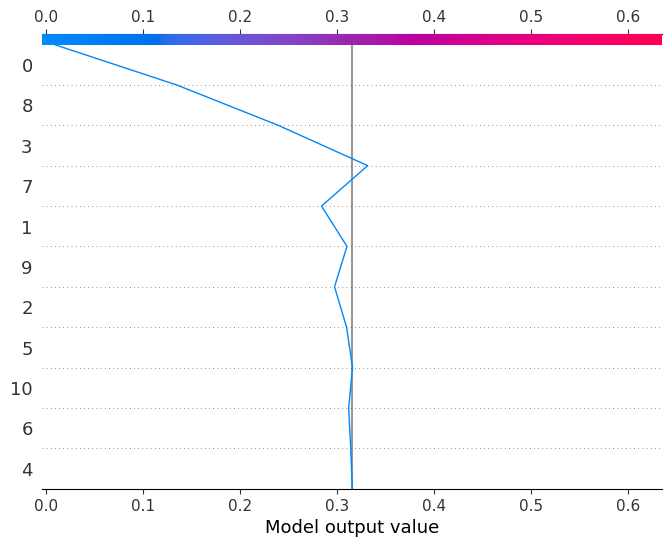

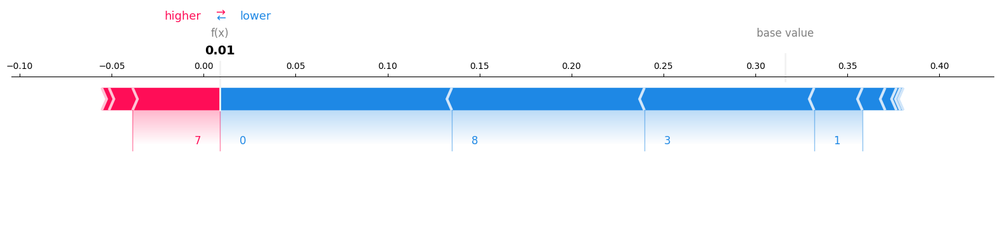

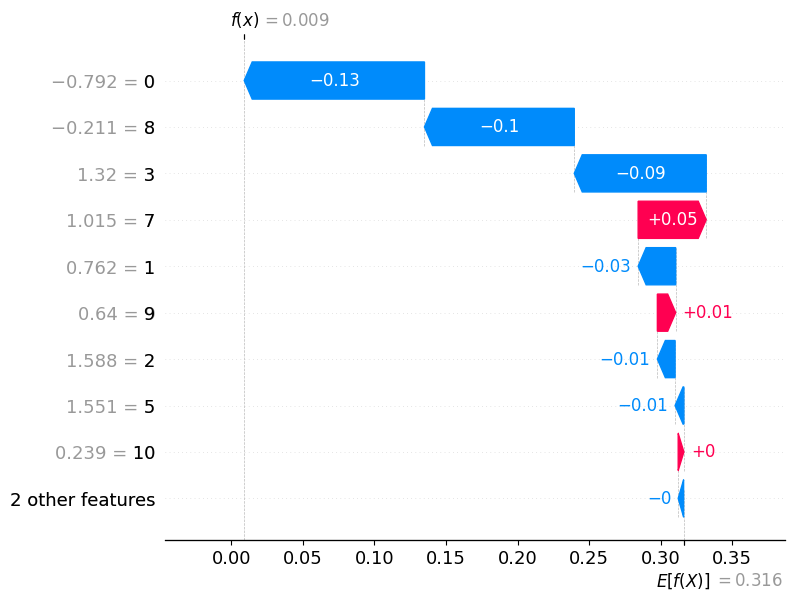

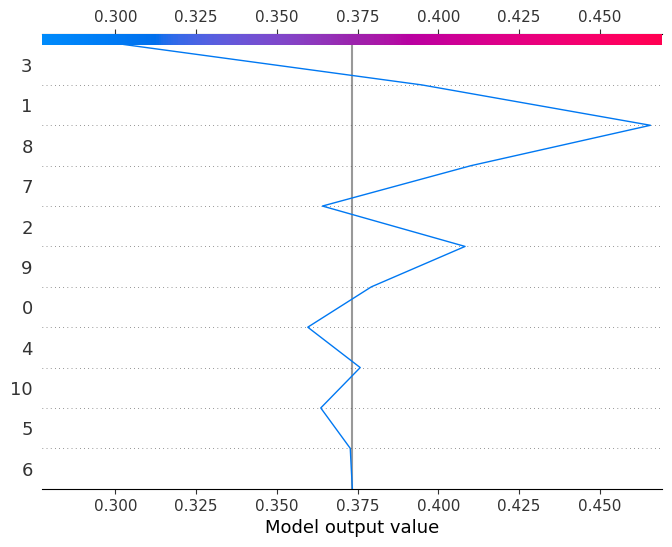

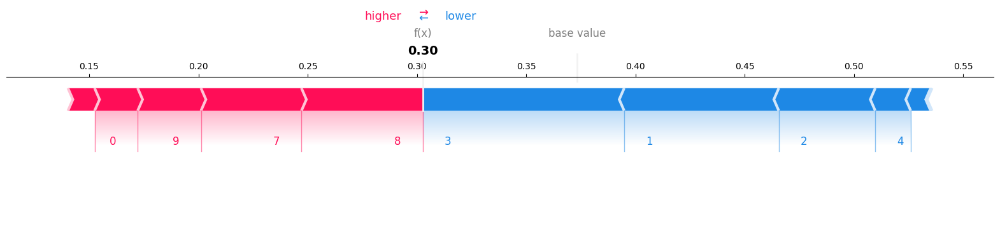

...

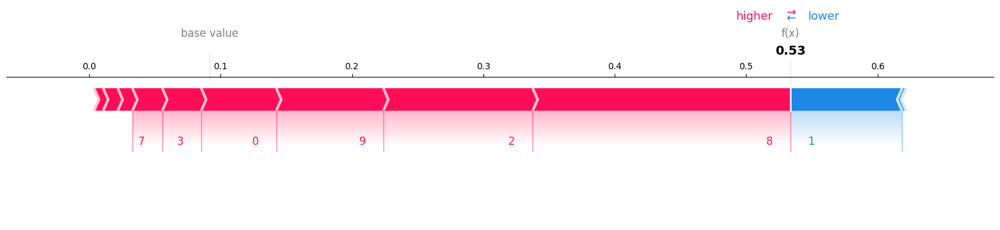

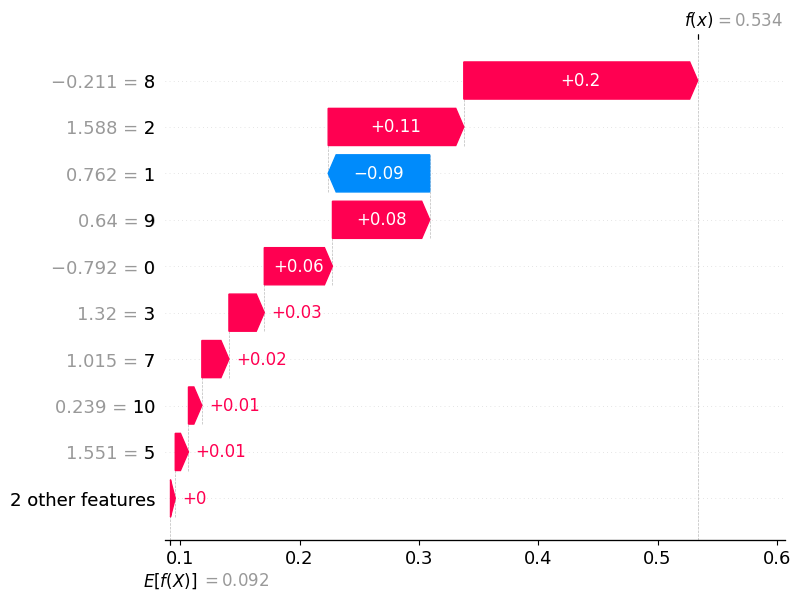

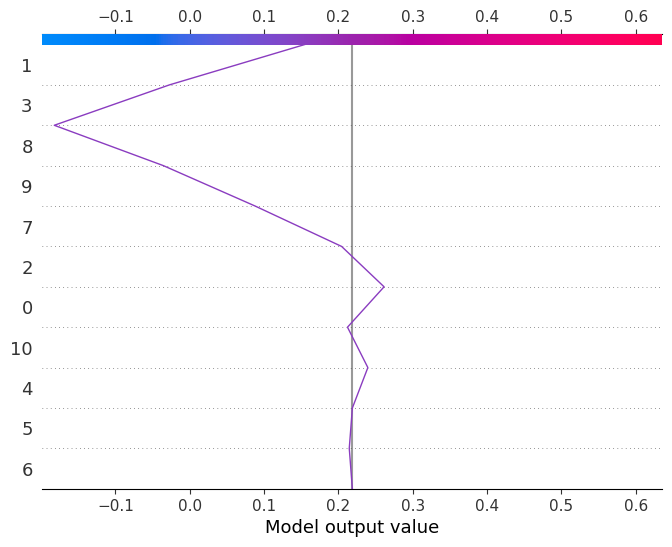

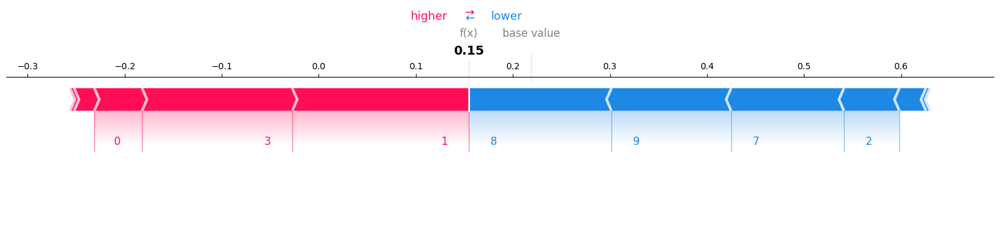

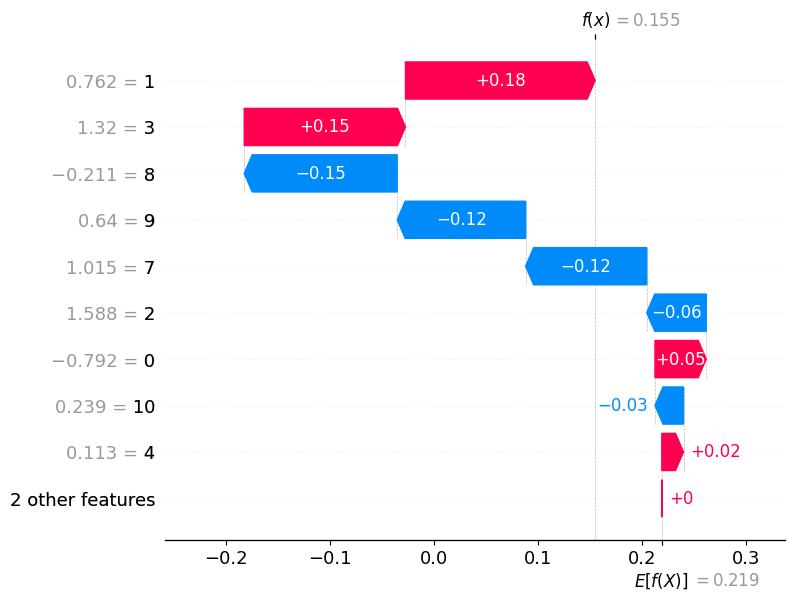

  0%|          | 0/1 [00:00<?, ?it/s]

320/320 [==============================] - 1s 2ms/step


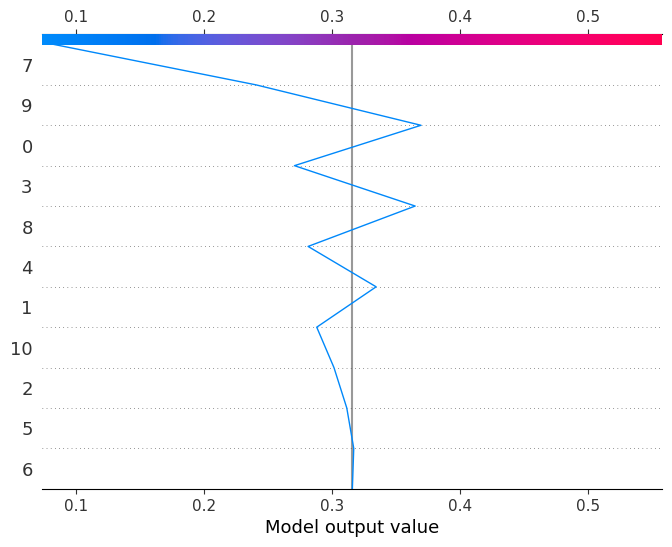

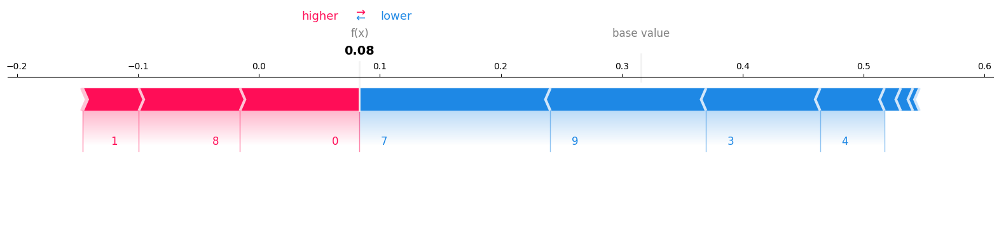

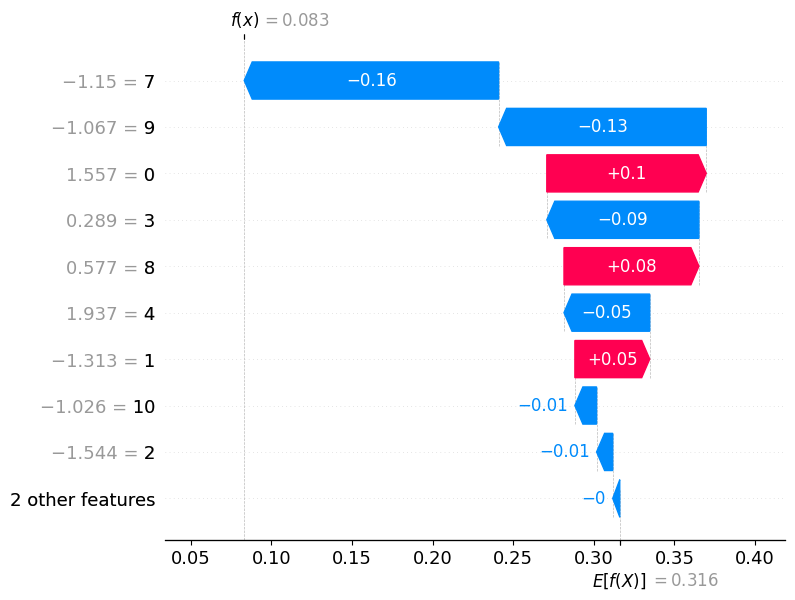

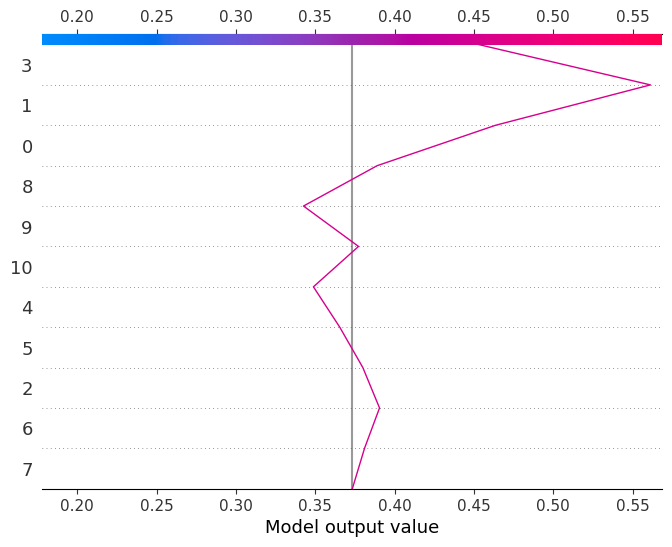

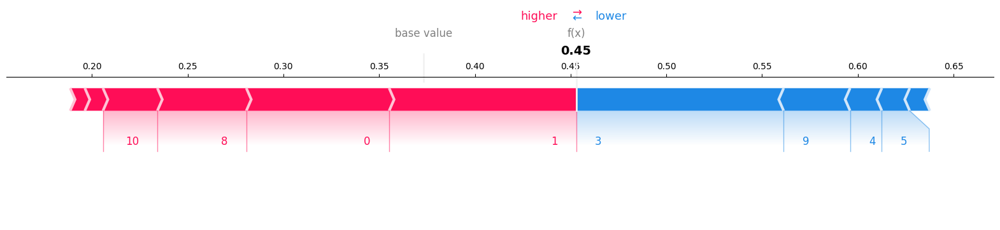

...

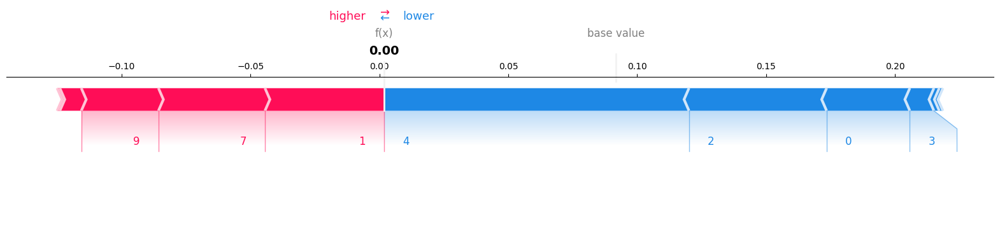

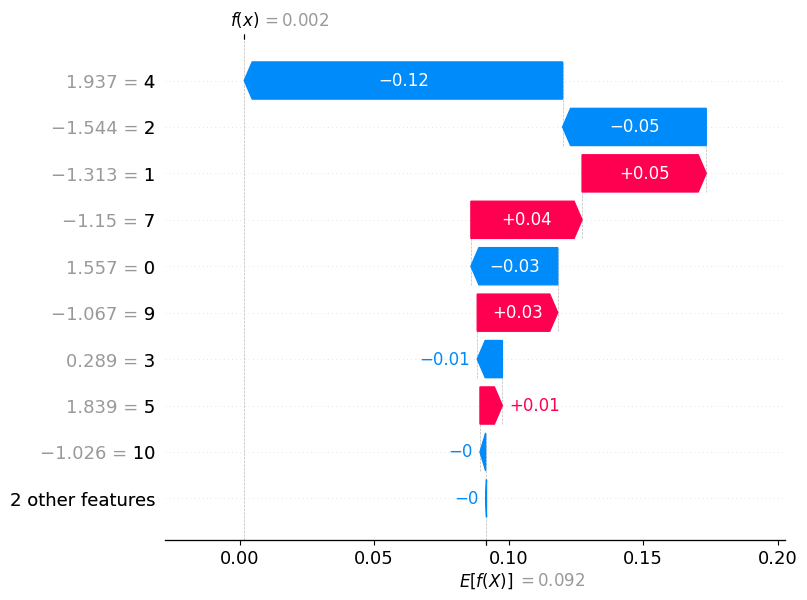

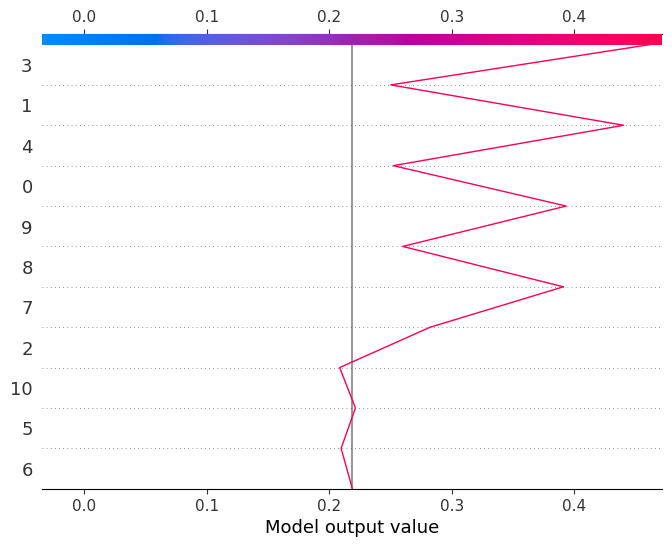

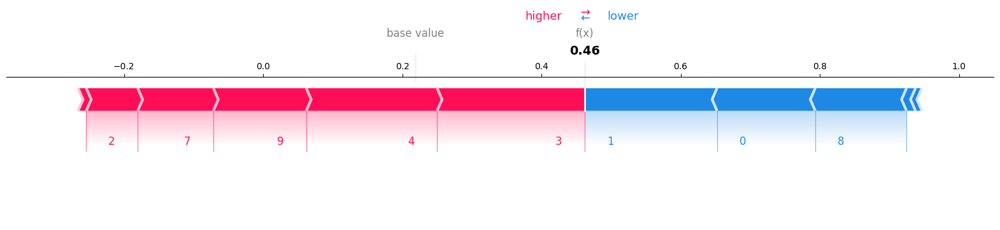

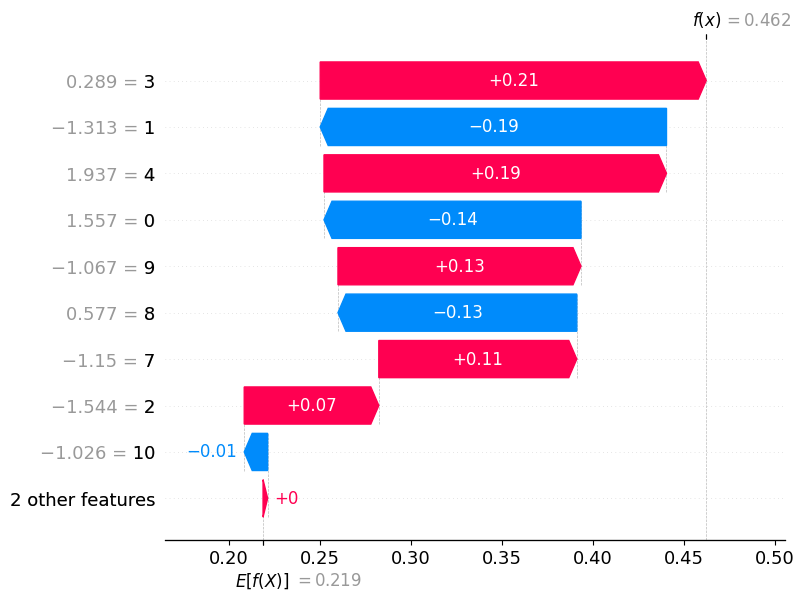

  0%|          | 0/1 [00:00<?, ?it/s]

320/320 [==============================] - 1s 2ms/step


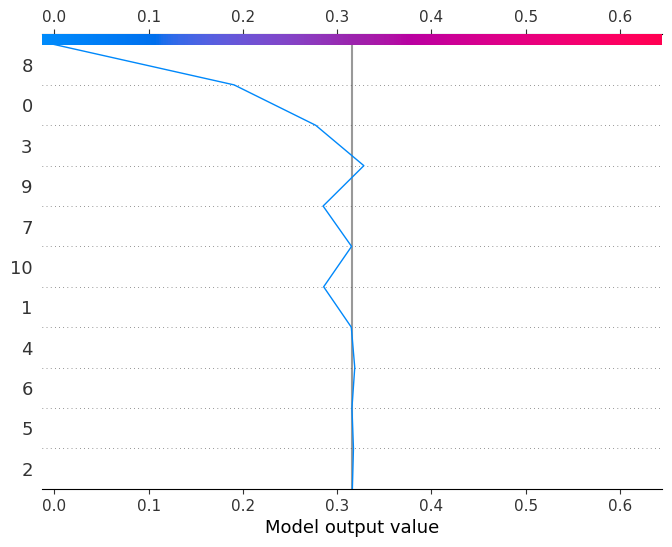

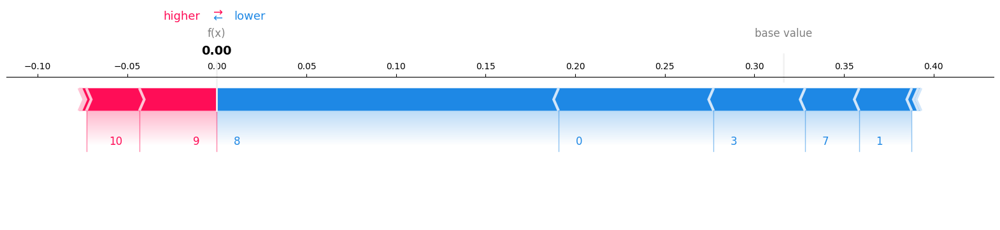

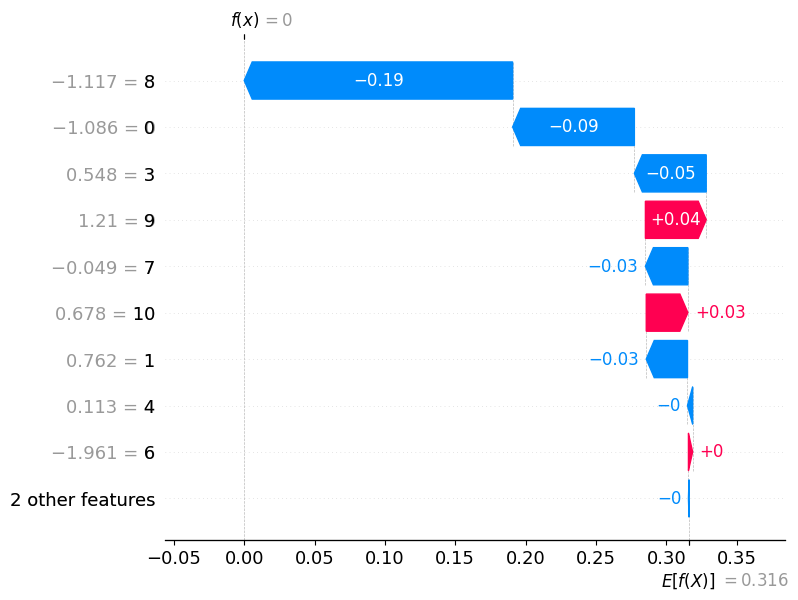

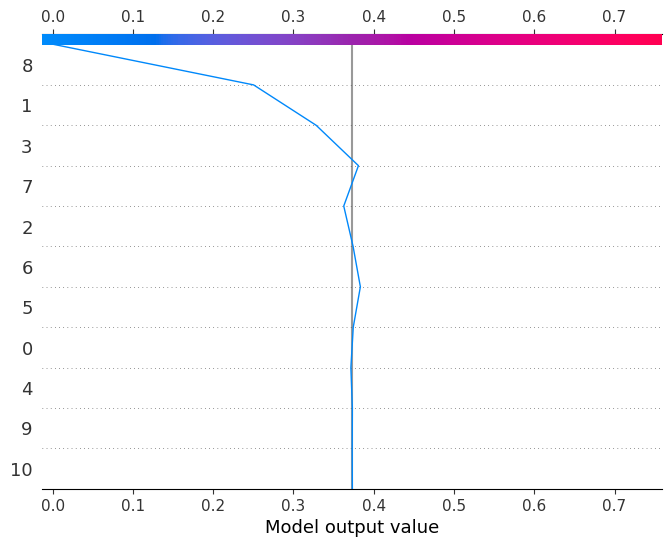

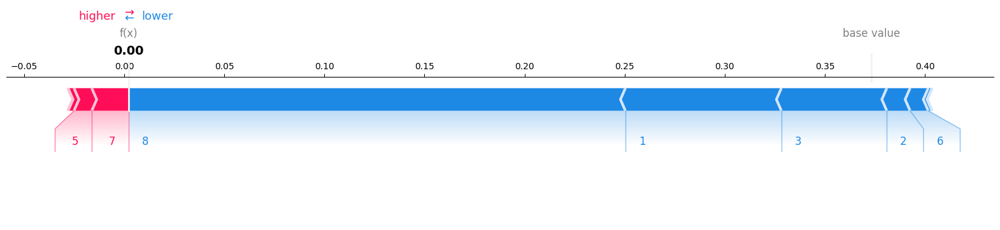

...

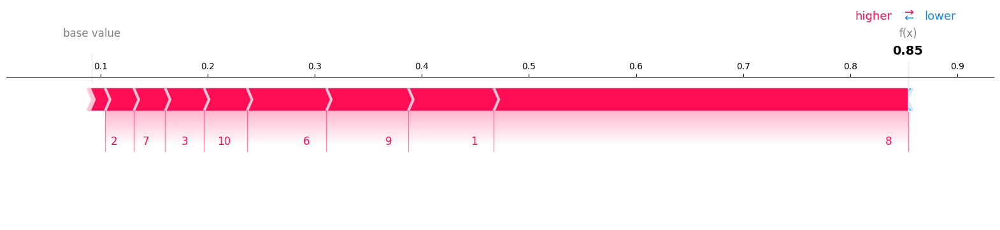

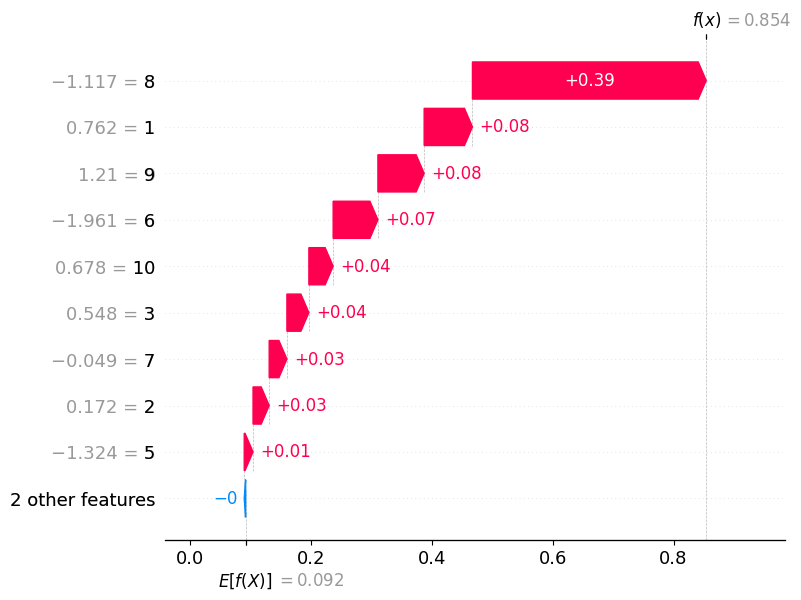

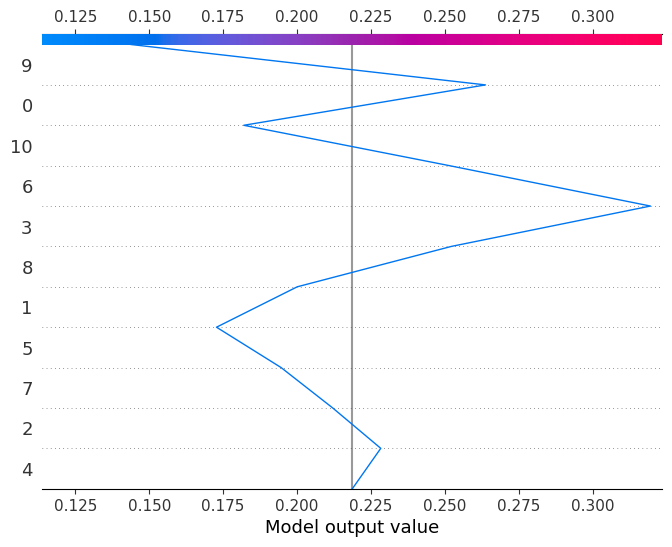

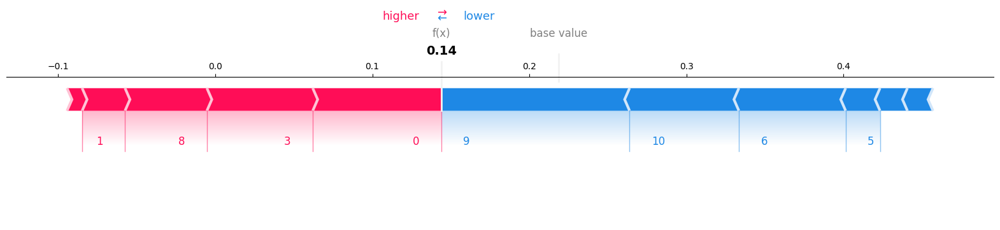

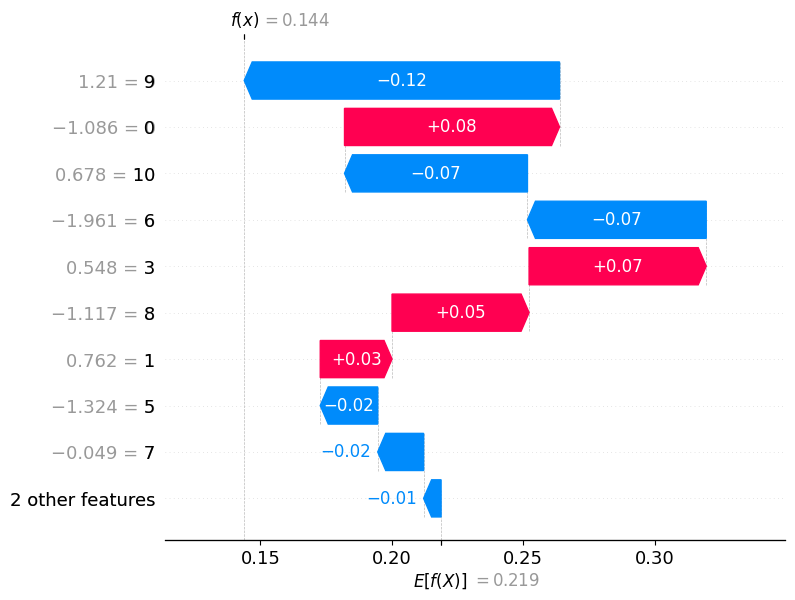

  0%|          | 0/1 [00:00<?, ?it/s]

320/320 [==============================] - 1s 3ms/step


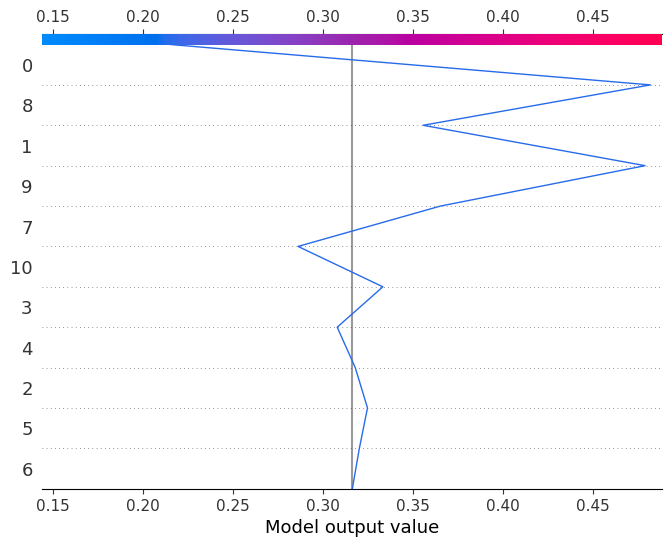

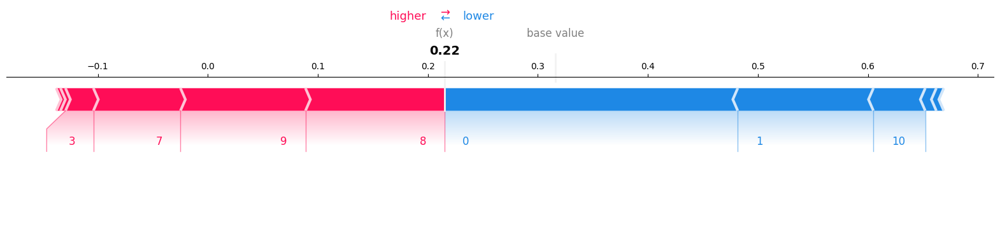

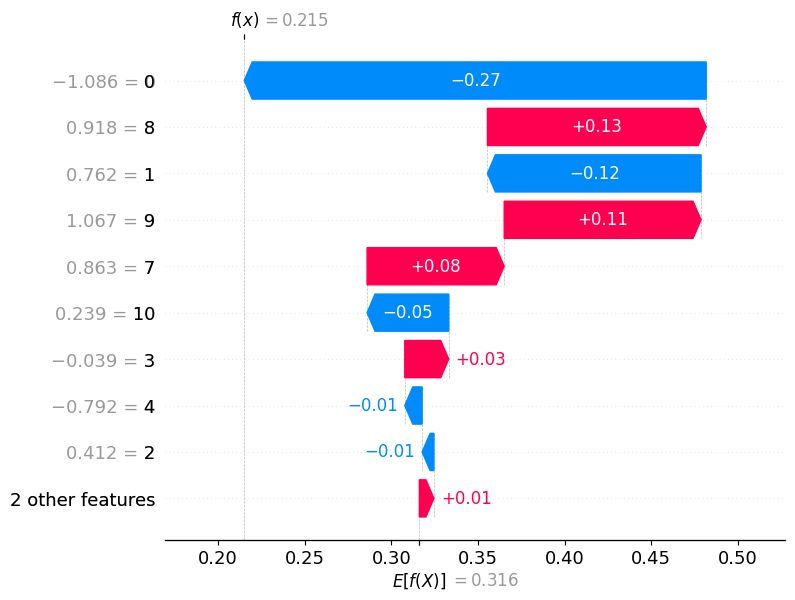

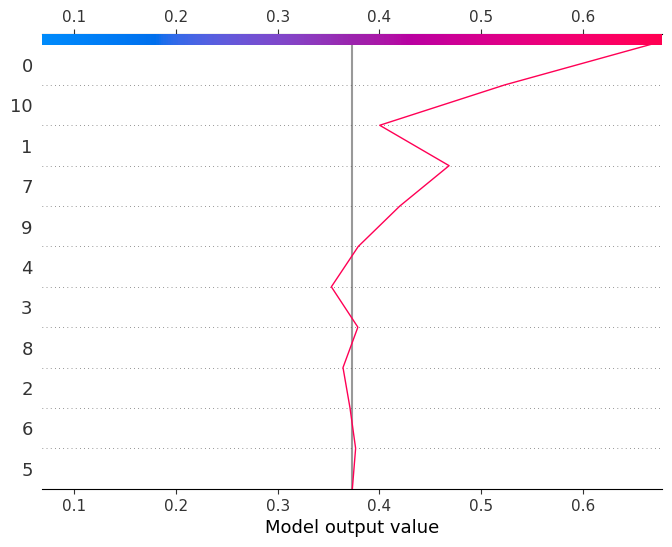

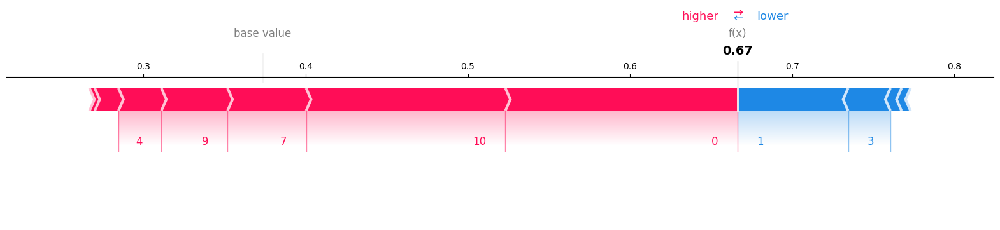

...

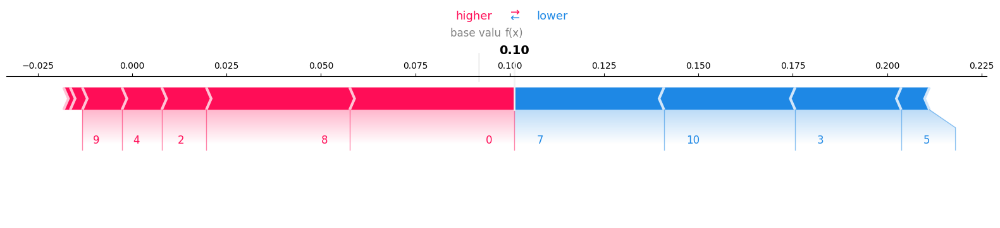

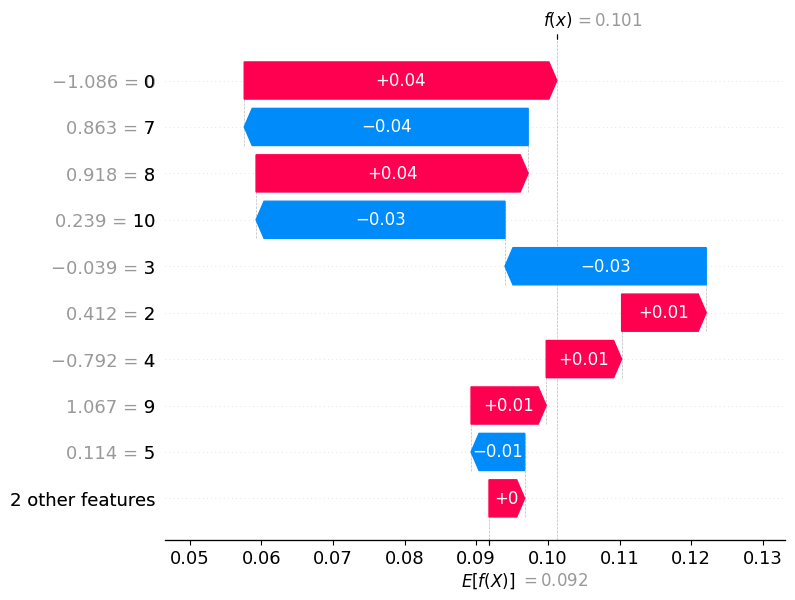

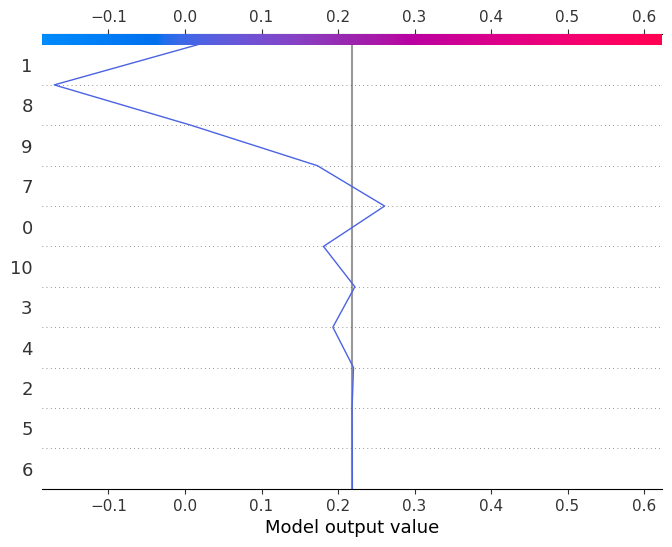

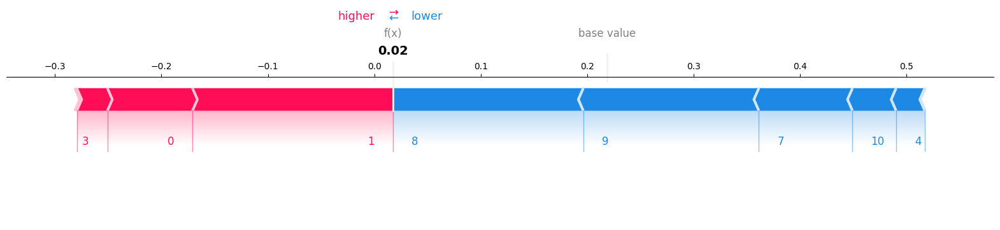

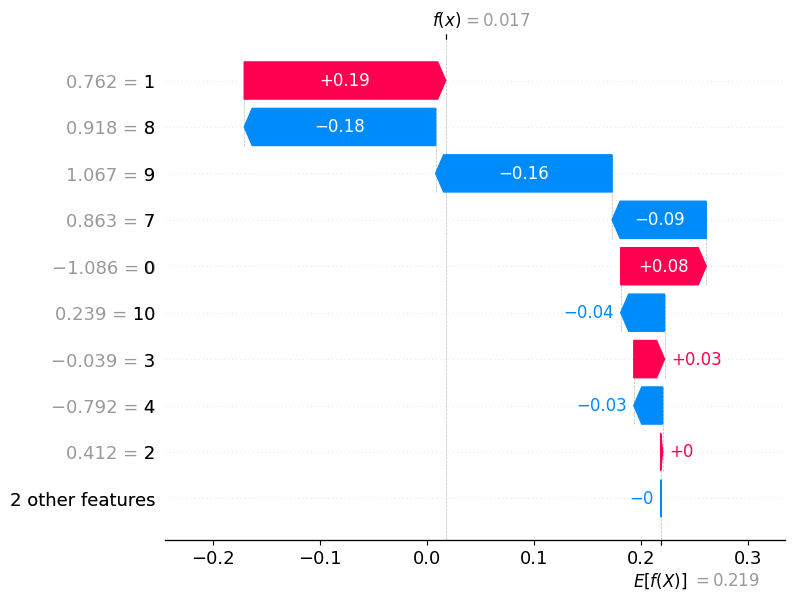

  0%|          | 0/1 [00:00<?, ?it/s]

320/320 [==============================] - 2s 5ms/step


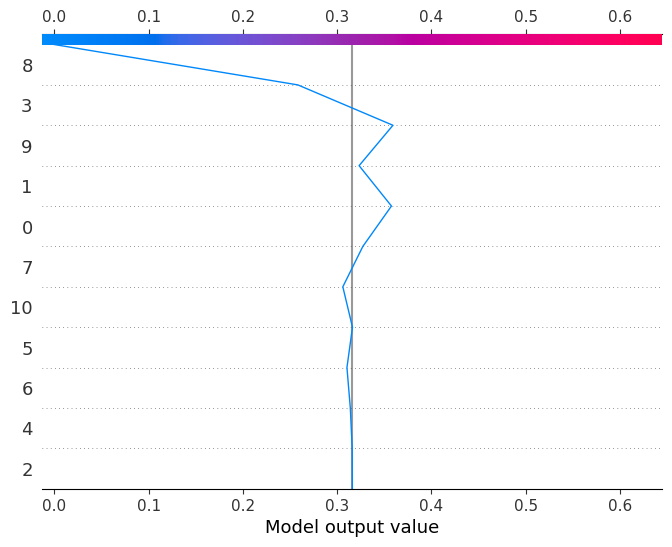

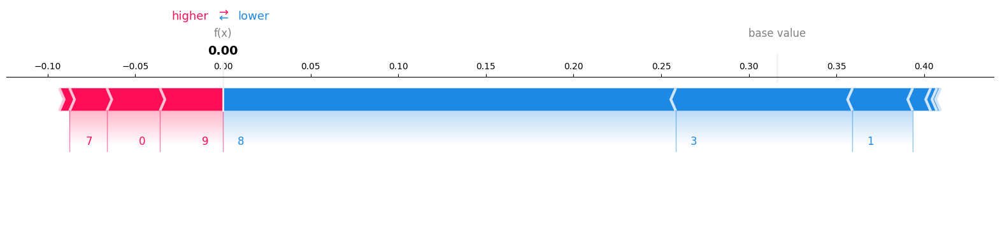

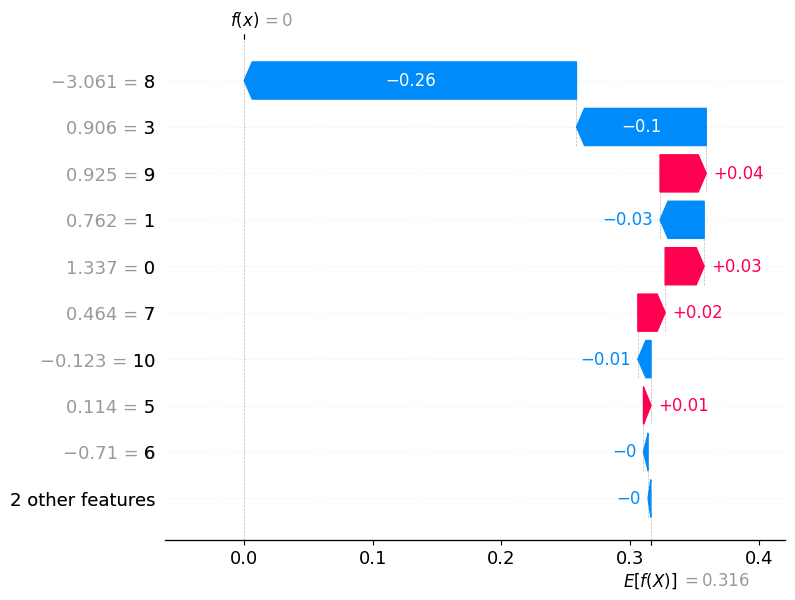

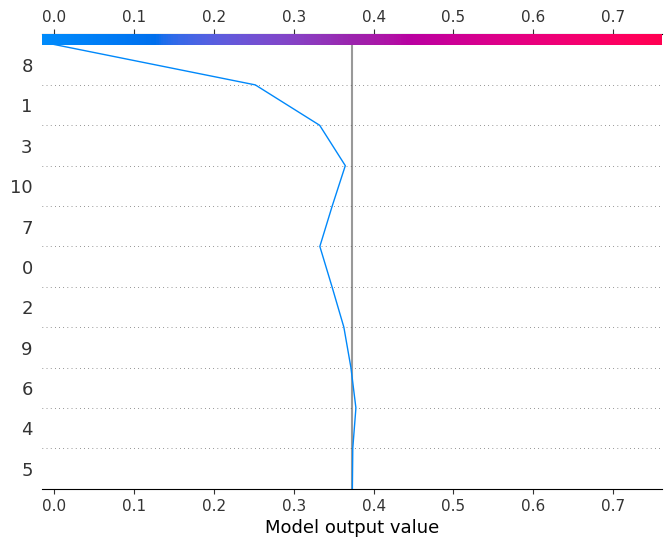

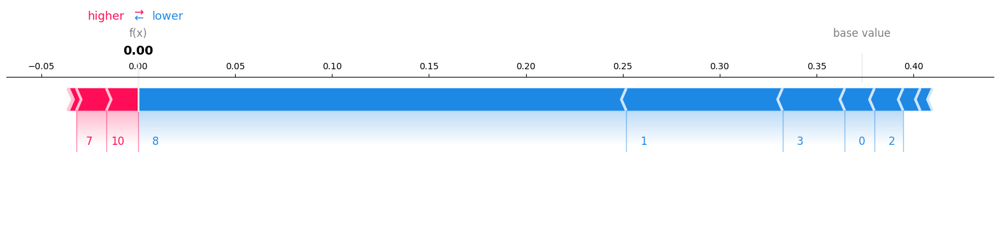

...

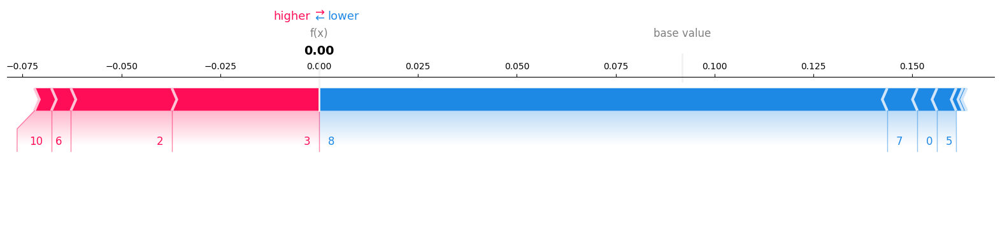

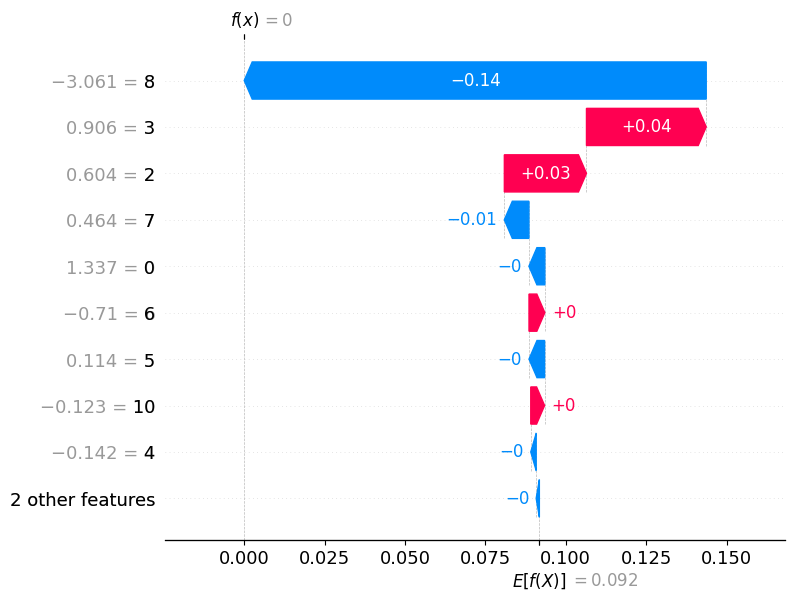

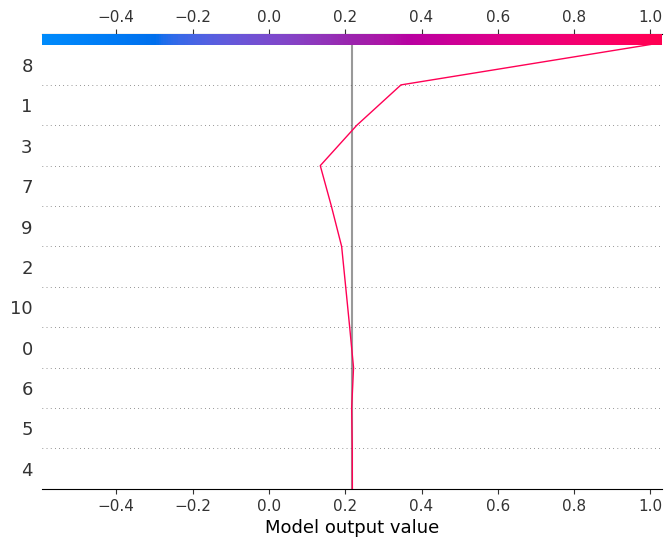

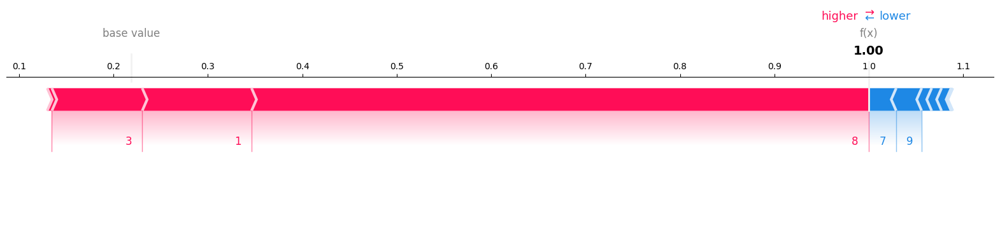

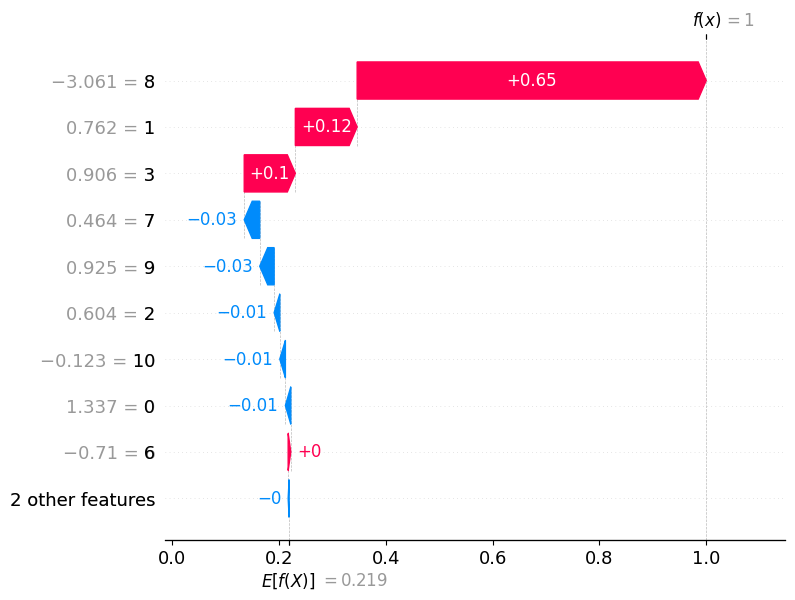

  0%|          | 0/1 [00:00<?, ?it/s]

320/320 [==============================] - 1s 2ms/step


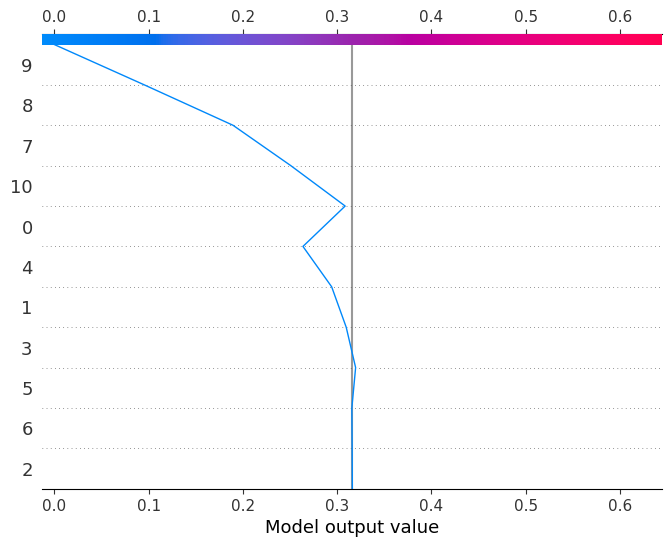

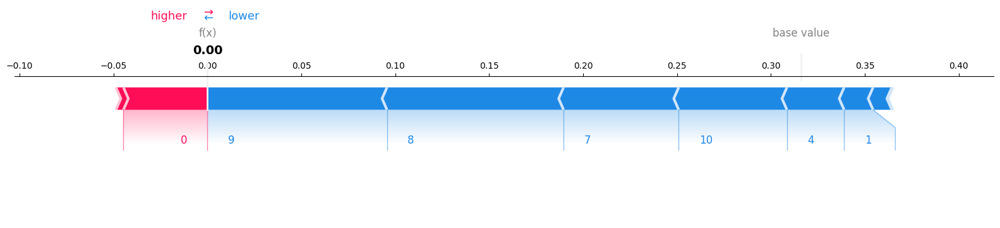

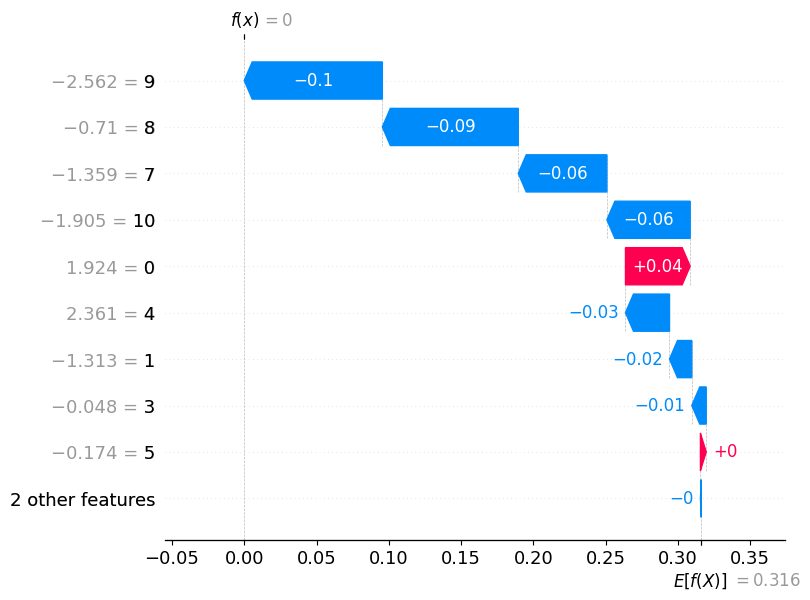

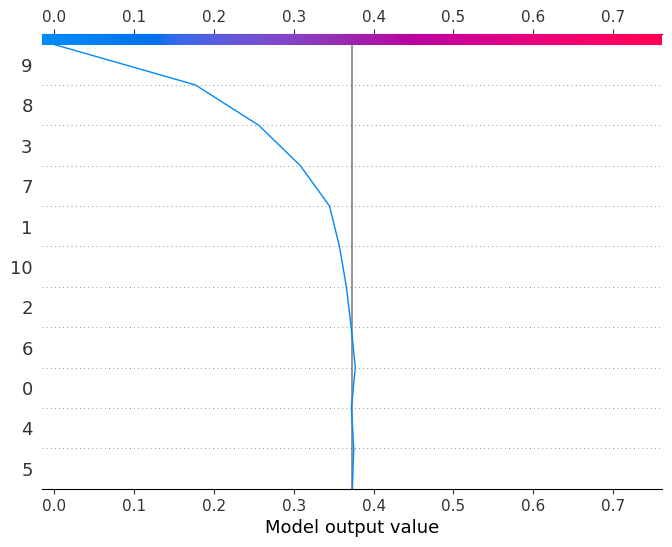

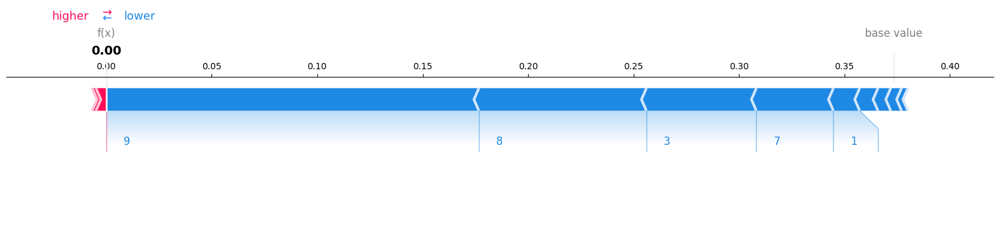

...

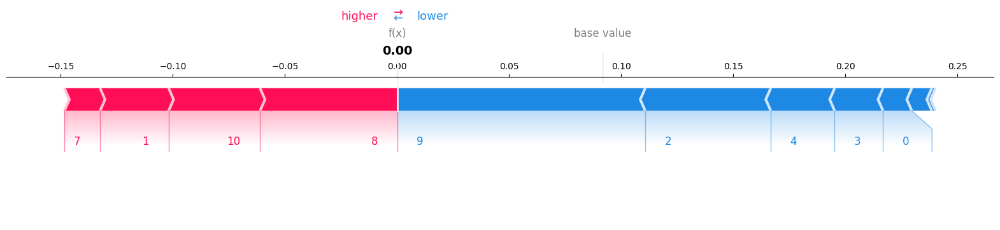

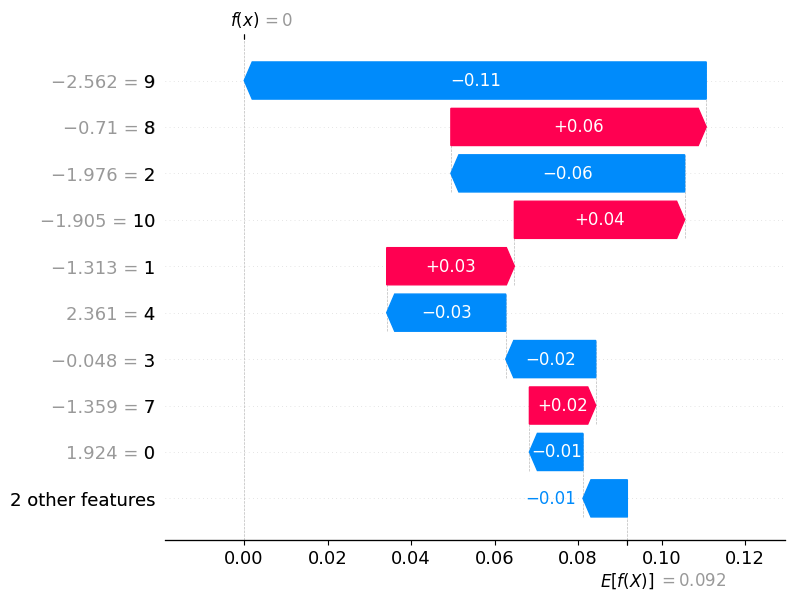

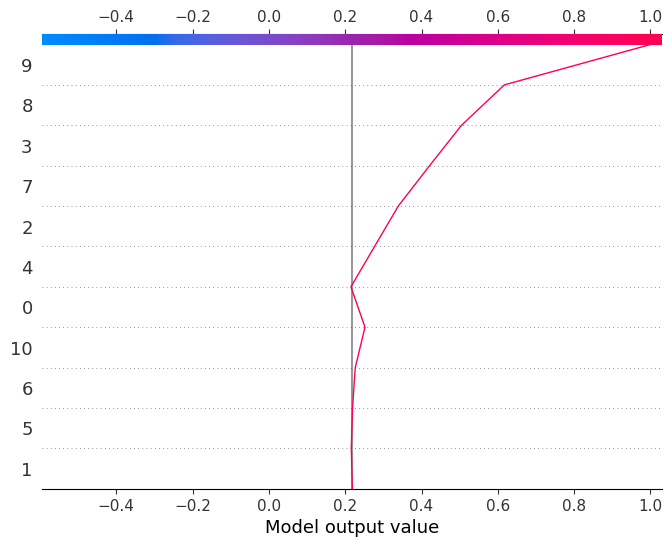

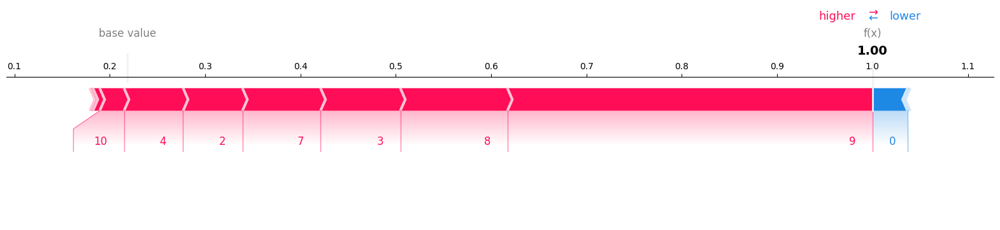

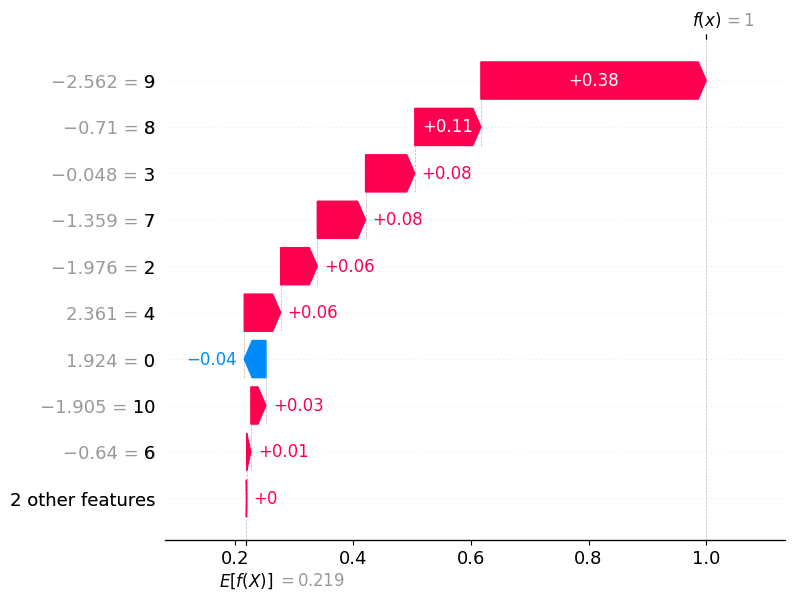

In [ ]:
# Преобразуем названия признаков в список
feature_names_list = list(X_test.columns)

for index, row in selected_samples.iterrows():
    # Получаем данные для текущего примера
    sample_data = row[feature_names_list].values.reshape(1, -1)

    # Вычисляем значения Шепли для этого примера
    shap_values_sample = explainer.shap_values(sample_data)

    # Для каждого класса создаем графики
    for class_index in range(4):  # Для четырех классов
        # Создаем decision_plot для класса
        shap.decision_plot(explainer.expected_value[class_index], shap_values_sample[class_index][0], feature_names=feature_names_list)
        plt.show()

        # Создаем force_plot для класса
        shap.force_plot(explainer.expected_value[class_index], shap_values_sample[class_index][0], feature_names=feature_names_list, matplotlib=True)
        plt.show()

        # Создаем Explanation объект для waterfall_plot
        shap_explanation = shap.Explanation(values=shap_values_sample[class_index][0],
                                            base_values=explainer.expected_value[class_index],
                                            data=sample_data[0],
                                            feature_names=feature_names_list)

        # Создаем waterfall_plot для класса
        shap.waterfall_plot(shap_explanation)
        plt.show()


## Регрессор


In [ ]:
# Загрузка модели
model_path = '/content/best_regression_model-lab1.h5'
model = tf.keras.models.load_model(model_path)

# Загрузка датасета
dataset_path = '/content/combined_test_dataset-lab1_regression.csv'
data = pd.read_csv(dataset_path)
X_test = data.drop('label', axis=1)
y_test = data['label']


### Расчет значений Шепли

In [ ]:
# Создаем объект KernelExplainer
explainer = shap.KernelExplainer(model.predict, shap.sample(X_test, 100))  # Используем подвыборку для ускорения расчета

# Расчет значений Шепли
shap_values = explainer.shap_values(X_test, nsamples=100)  # Ограничиваем количество образцов для ускорения процесса

# Вывод результатов
print(shap_values)


4/4 [==============================] - 0s 6ms/step


  0%|          | 0/193 [00:00<?, ?it/s]

313/313 [==============================] - 1s 2ms/step


Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 88 iterations, alpha=1.189e+04, previous alpha=1.189e+04, with an active set of 47 regressors.
Linear regression equation is singular, Moore-Penrose pseudoinverse is used instead of the regular inverse.
To use regular inverse do one of the following:
1) turn up the number of samples,
2) turn up the L1 regularization with num_features(N) where N is less than the number of samples,
3) group features together to reduce the number of inputs that need to be explained.


313/313 [==============================] - 1s 2ms/step


Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 107 iterations, alpha=1.873e-07, previous alpha=1.863e-07, with an active set of 50 regressors.


313/313 [==============================] - 1s 2ms/step


Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 122 iterations, alpha=1.340e-07, previous alpha=1.330e-07, with an active set of 51 regressors.


313/313 [==============================] - 1s 2ms/step
[array([[74631.06361268, -5446.43053277,     0.        , ...,
            0.        ,     0.        ,     0.        ],
       [    0.        ,     0.        ,     0.        , ...,
            0.        ,     0.        ,     0.        ],
       [    0.        ,     0.        ,     0.        , ...,
            0.        ,     0.        ,     0.        ],
       ...,
       [    0.        ,     0.        ,     0.        , ...,
            0.        ,     0.        ,     0.        ],
       [    0.        ,     0.        ,     0.        , ...,
            0.        ,     0.        ,     0.        ],
       [    0.        ,     0.        ,     0.        , ...,
            0.        ,     0.        ,     0.        ]])]


### Вычисляем среднее абсолютное значение Шепли

In [ ]:
# Расчет средних абсолютных значений Шепли для каждого признака
# Используем map и lambda для обработки каждого элемента в списке
mean_abs_shap_values = np.mean(np.array(list(map(lambda x: np.abs(x), shap_values))), axis=0)
print(mean_abs_shap_values)


[[74631.06361268  5446.43053277     0.         ...     0.
      0.             0.        ]
 [    0.             0.             0.         ...     0.
      0.             0.        ]
 [    0.             0.             0.         ...     0.
      0.             0.        ]
 ...
 [    0.             0.             0.         ...     0.
      0.             0.        ]
 [    0.             0.             0.         ...     0.
      0.             0.        ]
 [    0.             0.             0.         ...     0.
      0.             0.        ]]


### Визуализация значений Шепли и важности признаков

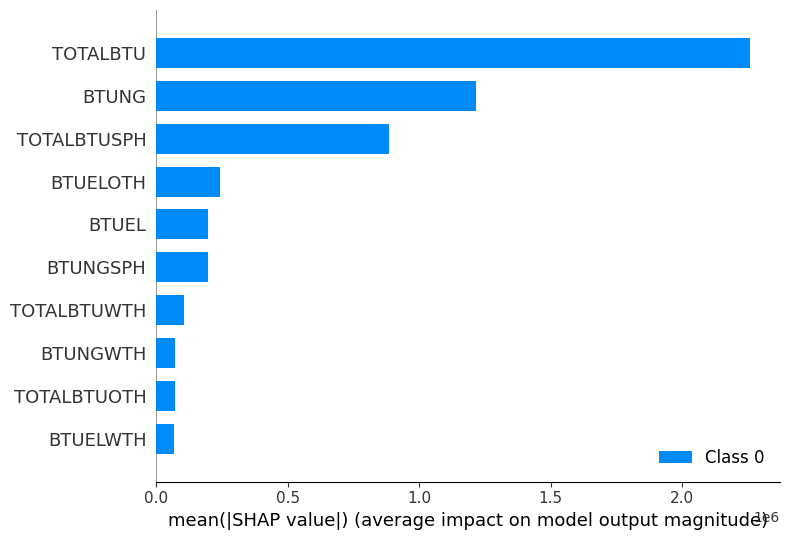

In [ ]:
# Визуализация с помощью summary_plot для 10 самых важных признаков
shap.summary_plot(shap_values, features=X_test, feature_names=X_test.columns, max_display=10)


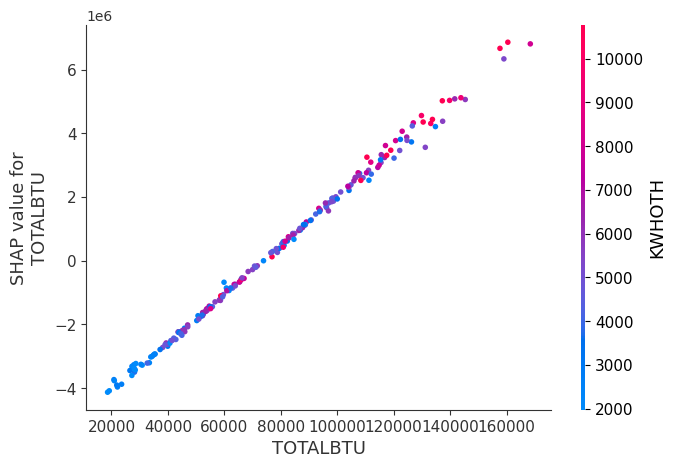

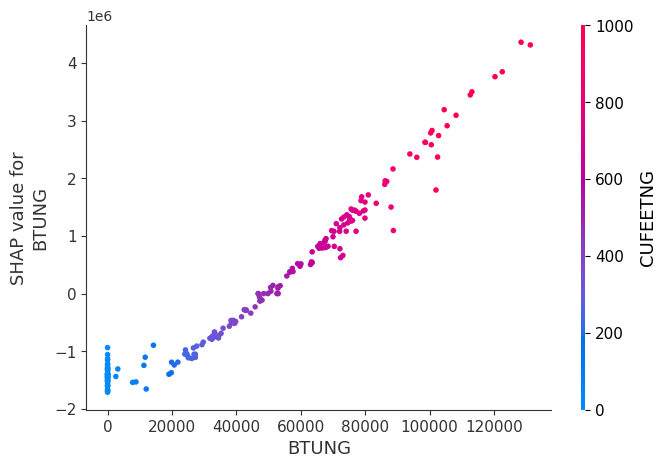

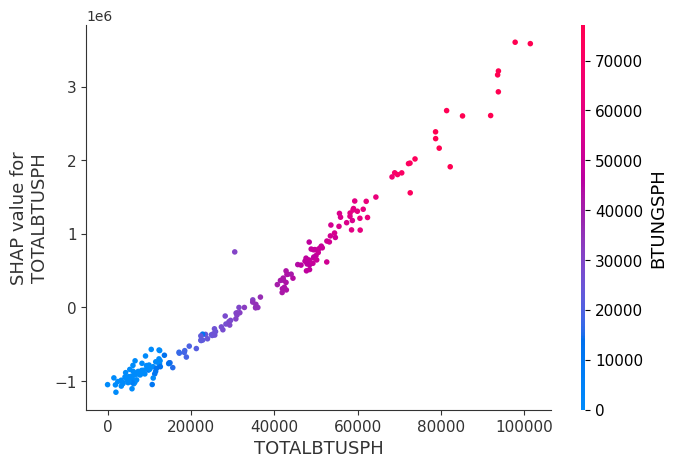

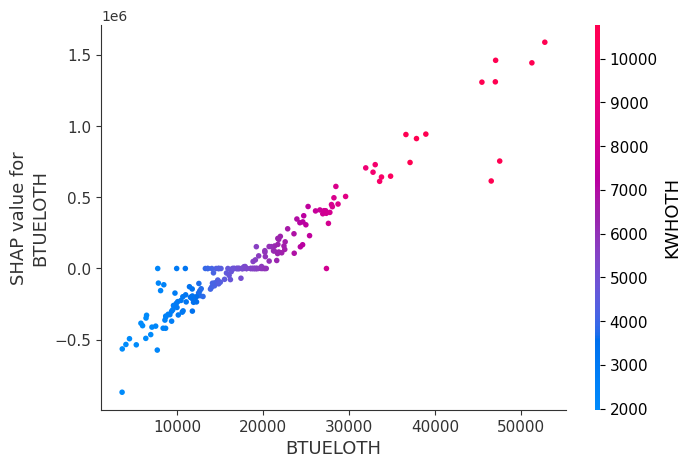

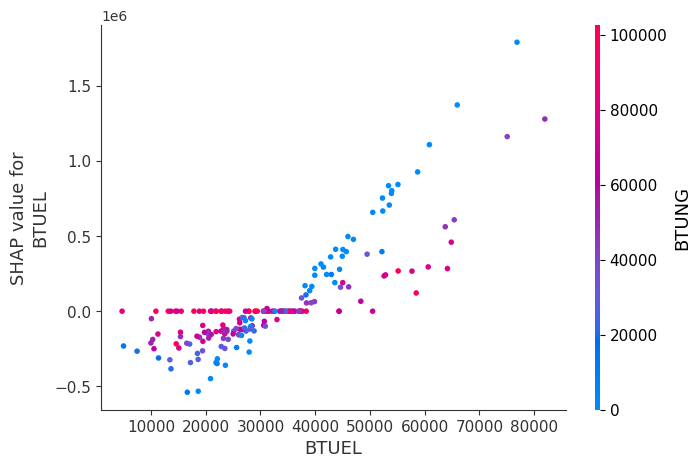

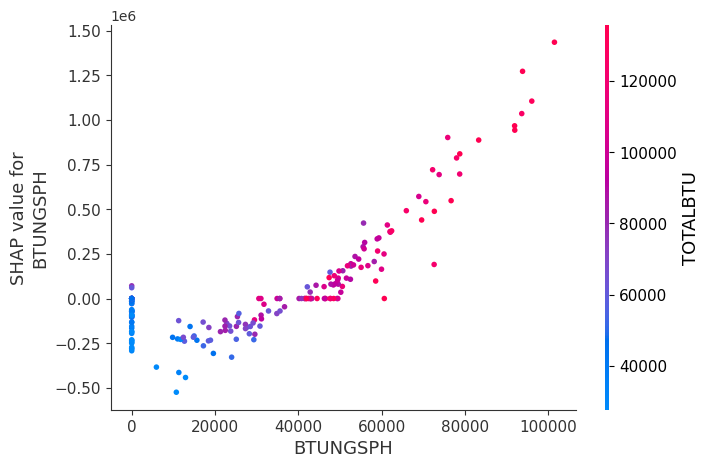

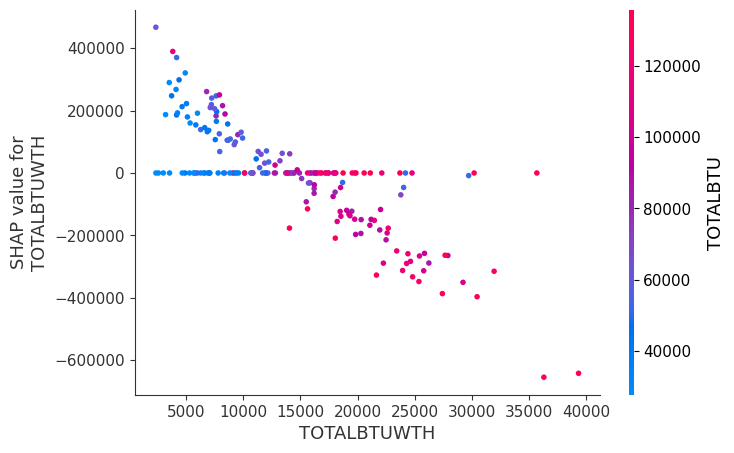

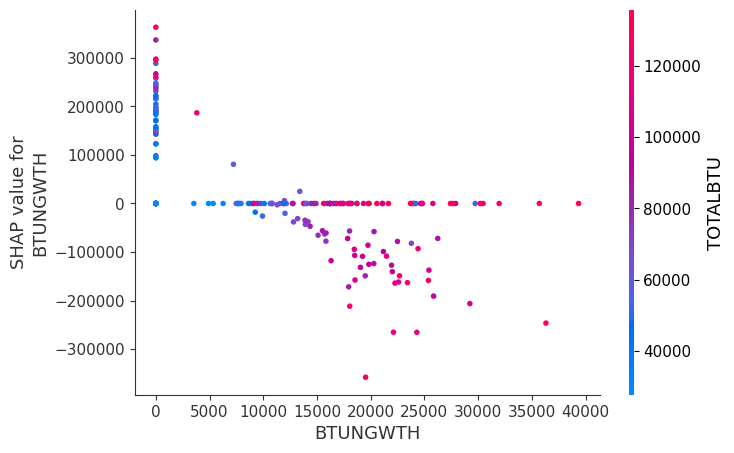

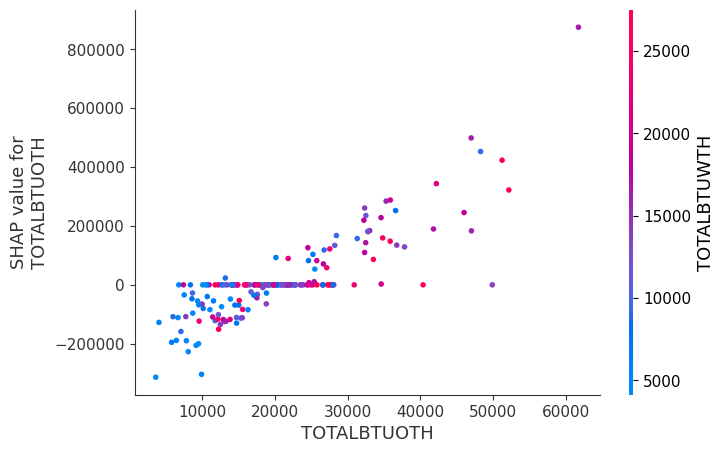

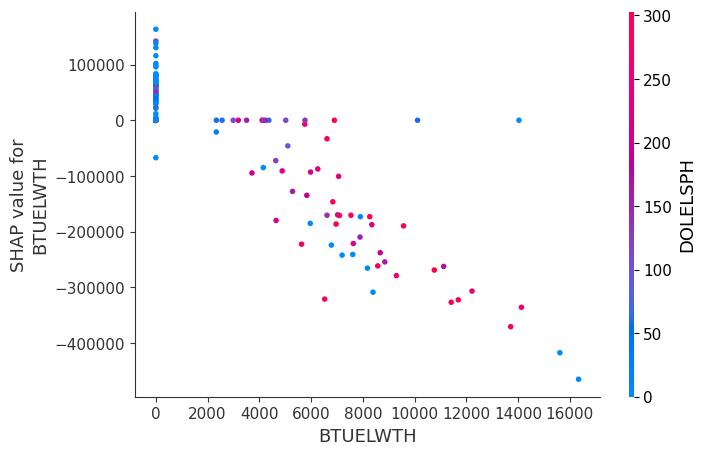

In [ ]:
shap_values_array = np.array(shap_values[0])  # Преобразуем первый элемент списка в NumPy массив

# Вычисляем средние абсолютные значения Шепли для каждого признака
mean_abs_shap_values = np.abs(shap_values_array).mean(axis=0)

# Получаем индексы 10 наиболее важных признаков
top_indices = np.argsort(-mean_abs_shap_values)[:10]

# Получаем названия 10 самых важных признаков
top_feature_names = X_test.columns[top_indices]

# Создаем dependence_plot для каждого из топ 10 признаков
for feature_name in top_feature_names:
    shap.dependence_plot(feature_name, shap_values_array, X_test, interaction_index="auto")



### Детальный анализ отдельных примеров

  0%|          | 0/1 [00:00<?, ?it/s]

6857/6857 [==============================] - 14s 2ms/step


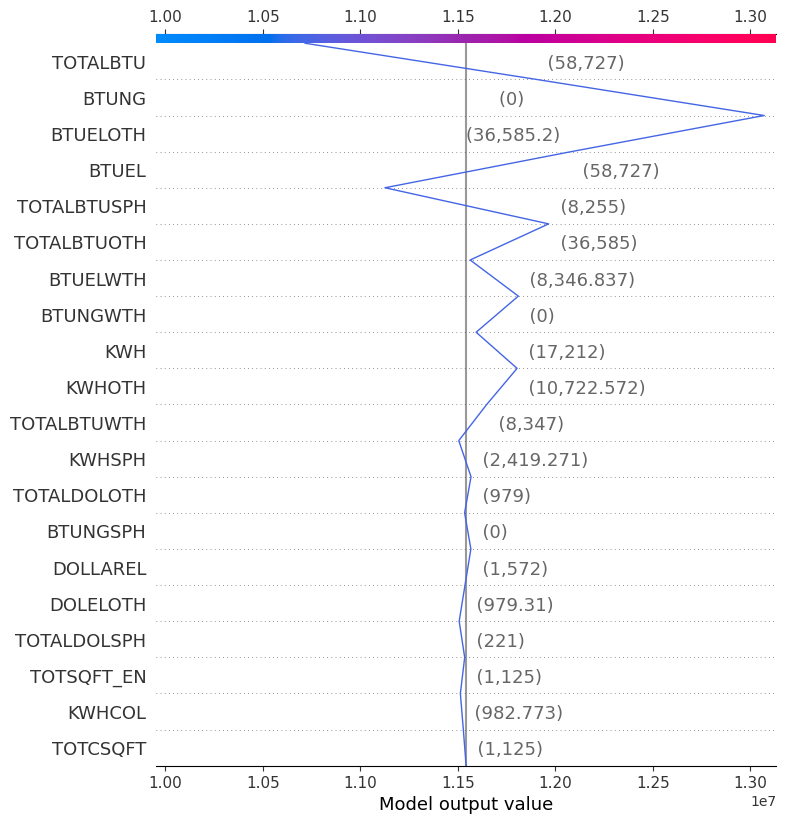

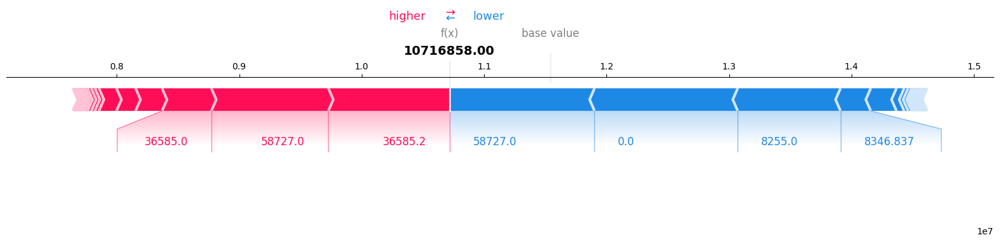

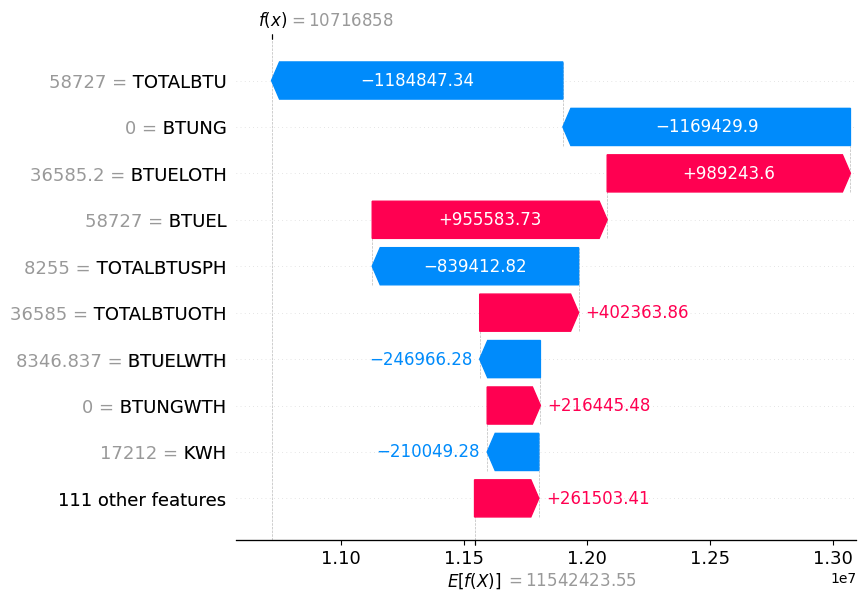

  0%|          | 0/1 [00:00<?, ?it/s]

6857/6857 [==============================] - 13s 2ms/step


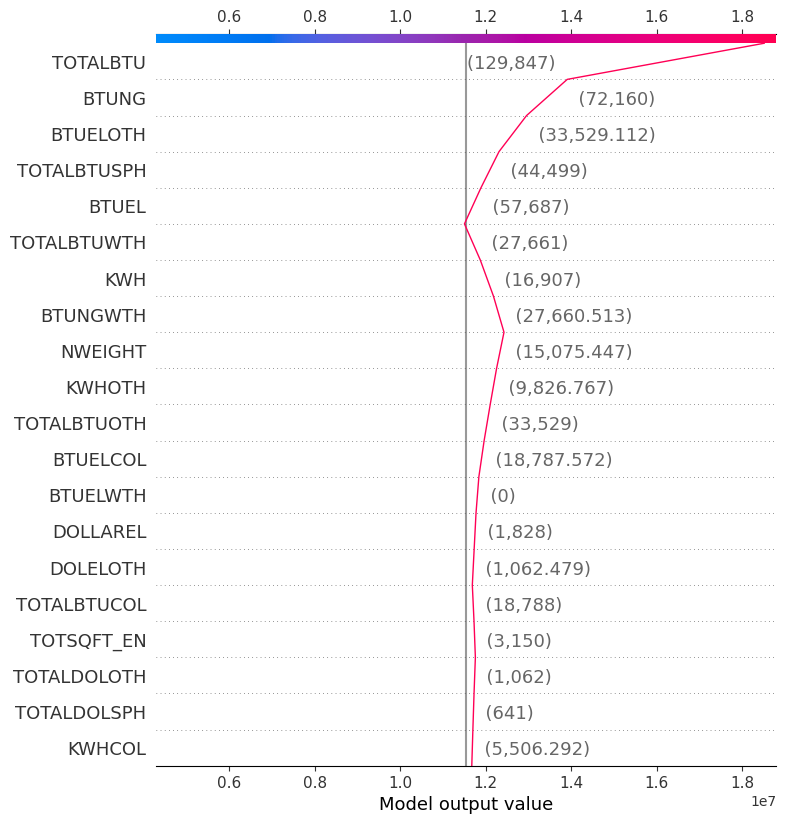

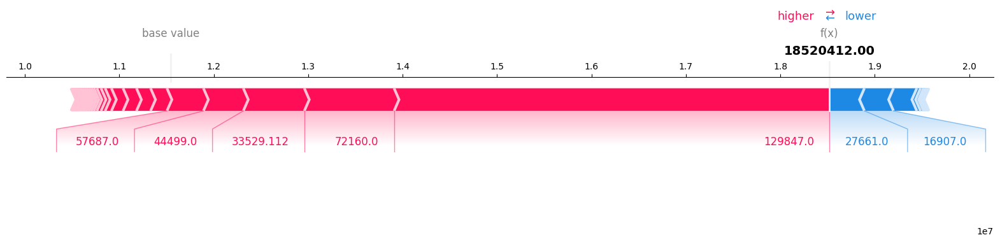

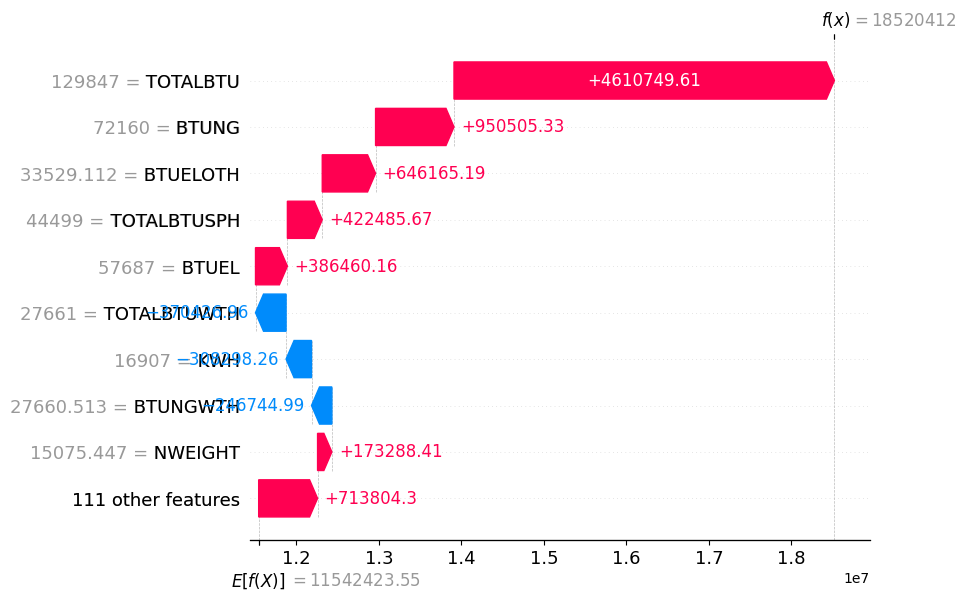

In [ ]:
# Выбираем конкретные примеры для анализа
selected_indices = [0, 1]  # Например, первые два примера из набора данных
selected_examples = X_test.iloc[selected_indices]

for i in selected_indices:
    # Получаем данные для текущего примера
    sample_data = selected_examples.iloc[i].values.reshape(1, -1)

    # Вычисляем значения Шепли для этого примера
    shap_values_sample = explainer.shap_values(sample_data)

    # Создаем Explanation объект для waterfall_plot
    shap_explanation = shap.Explanation(values=shap_values_sample[0][0],
                                        base_values=explainer.expected_value,
                                        data=sample_data[0],
                                        feature_names=X_test.columns)

    # Создаем decision_plot
    shap.decision_plot(explainer.expected_value, shap_values_sample[0][0], selected_examples.iloc[i])
    plt.show()

    # Создаем force_plot
    shap.force_plot(explainer.expected_value, shap_values_sample[0][0], selected_examples.iloc[i].values, matplotlib=True)
    plt.show()

    # Создаем waterfall_plot
    shap.waterfall_plot(shap_explanation)
    plt.show()


### Создание графиков частичной зависимости (Partial Dependence Plots, PDP) и индивидуального условного ожидания (Individual Conditional Expectation, ICE)

График частичной зависимости

7/7 [==============================] - 0s 2ms/step


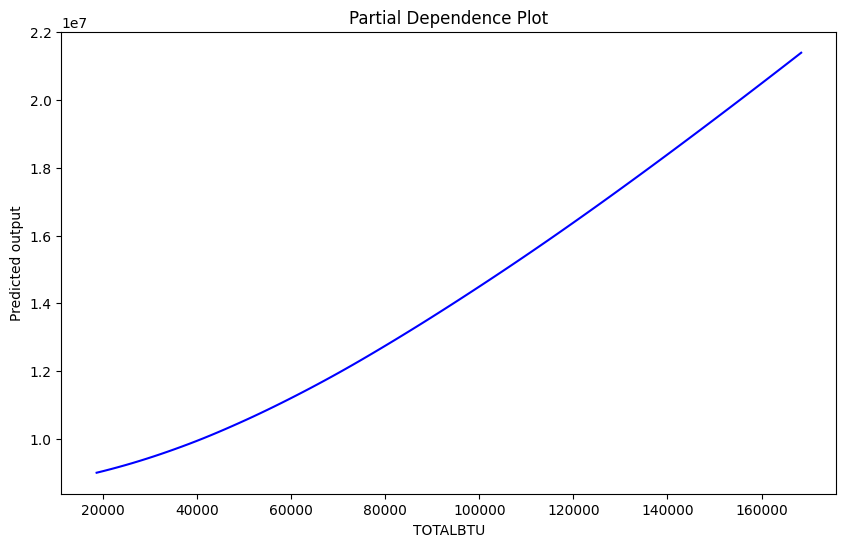

In [ ]:
# Выбираем признак для PDP
feature = 'TOTALBTU'
feature_index = X_test.columns.tolist().index(feature)

# Создаем равномерно распределенные значения для признака
feature_values = np.linspace(X_test[feature].min(), X_test[feature].max(), 100)
predictions = []

# Вычисляем прогнозы модели для каждого значения признака
for val in feature_values:
    X_temp = X_test.copy()
    X_temp[feature] = val
    predictions.append(model.predict(X_temp).mean())

# Визуализация PDP
plt.figure(figsize=(10, 6))
plt.plot(feature_values, predictions, color='blue')
plt.xlabel(feature)
plt.ylabel('Predicted output')
plt.title('Partial Dependence Plot')
plt.show()


График индивидуального условного ожидания

1/1 [==============================] - 0s 20ms/step


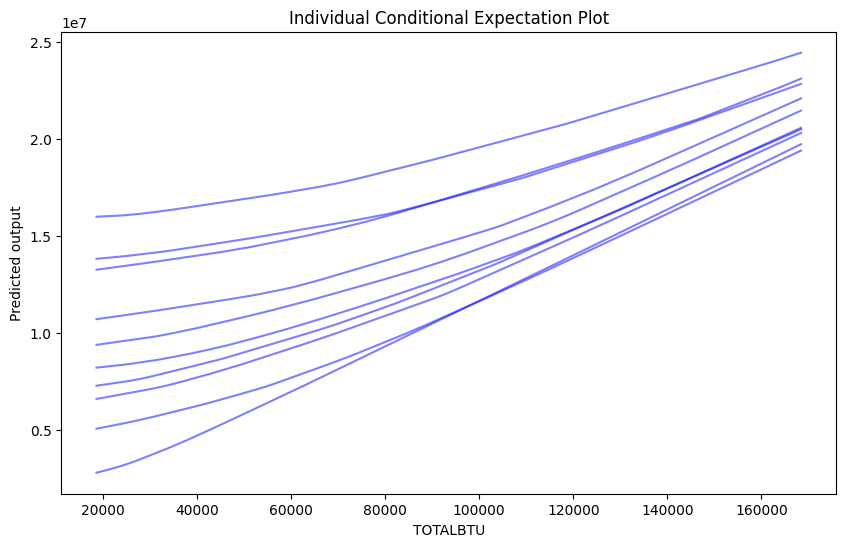

In [ ]:
# Создаем равномерно распределенные значения для признака
feature_values = np.linspace(X_test[feature].min(), X_test[feature].max(), 100)

# Визуализация ICE
plt.figure(figsize=(10, 6))
for index, row in X_test.sample(10).iterrows():
    predictions = []
    for val in feature_values:
        X_temp = row.copy()
        X_temp[feature] = val
        pred = model.predict(X_temp.values.reshape(1, -1))
        predictions.append(pred[0])

    plt.plot(feature_values, predictions, color='blue', alpha=0.5)  # Прозрачность для визуализации перекрытия

plt.xlabel(feature)
plt.ylabel('Predicted output')
plt.title('Individual Conditional Expectation Plot')
plt.show()
